In [1]:
from deepliftmotifs import Trainer
from motifs import DijkMotifs, FimoMotifs, StubMotifs
import numpy as np
import pandas as pd
from modisco.visualization import viz_sequence

from dijk import get_ordered_data_with_annotations
from collections import defaultdict as ddict
%load_ext autoreload
%autoreload 2

Using TensorFlow backend.
TF-MoDISco is using the TensorFlow backend.


## TODO
- Make get_references + Trainer interaction more OOP
    - best fix: In motifs class, set the references indexes to correspond to non_empty_indices, and set non_empty_indices to seqs in references...then Trainer should work as is

- Remove NULL seqs for now and test (there's noise in a few seqs)
- Somehow reevaluate dijk motifs??? maybe they were good after all rel to refs
- maybe subtract refs from seqs?

In [2]:
df = pd.read_csv('./data/dijk/GSE92306_annotation_all_constructs.tsv', delimiter='\t')

In [3]:
_,_,ann = get_ordered_data_with_annotations()
refs = ddict(int)
setnames = ddict(int)
sequenceNames = ddict(int)
for i in range(len(ann)):
    setnames[ann[i]['SetName']] += 1
    refs[ann[i]['Context']] += 1
    sequenceNames[ann[i]['Sequence']] += 1

## Train Model and Get Scores

In [4]:
t = Trainer(DijkMotifs())

In [5]:
seqmodel = t.trainFullSequence(epochs=300)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.
Train on 6155 samples, validate on 1539 samples
Epoch 1/300
6155/6155 [==============================] - 3s 438us/step - loss: 0.4686 - val_loss: 0.3046
Epoch 2/300
6155/6155 [==============================] - 0s 58us/step - loss: 0.2921 - val_loss: 0.2733
Epoch 3/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.2657 - val_loss: 0.2602
Epoch 4/300
6155/6155 [==============================] - 0s 68us/step - loss: 0.2464 - val_loss: 0.2455
Epoch 5/300
6155/6155 [==============================] - 0s 63us/step - loss: 0.2294 - val_loss: 0.2314
Epoch 6/300
6155/6155 [==============================] - 0s 65us/step - loss: 0.2121 - val_loss: 0.2178
Epoch 7/300
6155/6155 [==============================] - 0s 64us/step - loss: 0.1945 - val_l

6155/6155 [==============================] - 0s 65us/step - loss: 0.0538 - val_loss: 0.0595
Epoch 70/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0527 - val_loss: 0.0607
Epoch 71/300
6155/6155 [==============================] - 0s 63us/step - loss: 0.0528 - val_loss: 0.0653
Epoch 72/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0535 - val_loss: 0.0581
Epoch 73/300
6155/6155 [==============================] - 0s 63us/step - loss: 0.0510 - val_loss: 0.0561
Epoch 74/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0489 - val_loss: 0.0552
Epoch 75/300
6155/6155 [==============================] - 0s 64us/step - loss: 0.0498 - val_loss: 0.0555
Epoch 76/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0487 - val_loss: 0.0562
Epoch 77/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0487 - val_loss: 0.0542
Epoch 78/300
6155/6155 [==============================] - 0s 63us/st

6155/6155 [==============================] - 0s 63us/step - loss: 0.0368 - val_loss: 0.0436
Epoch 147/300
6155/6155 [==============================] - 0s 66us/step - loss: 0.0362 - val_loss: 0.0452
Epoch 148/300
6155/6155 [==============================] - 0s 61us/step - loss: 0.0360 - val_loss: 0.0432
Epoch 149/300
6155/6155 [==============================] - 0s 63us/step - loss: 0.0355 - val_loss: 0.0478
Epoch 150/300
6155/6155 [==============================] - 0s 67us/step - loss: 0.0366 - val_loss: 0.0463
Epoch 151/300
6155/6155 [==============================] - 0s 61us/step - loss: 0.0351 - val_loss: 0.0440
Epoch 152/300
6155/6155 [==============================] - 0s 60us/step - loss: 0.0350 - val_loss: 0.0440
Epoch 153/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0350 - val_loss: 0.0433
Epoch 154/300
6155/6155 [==============================] - 0s 61us/step - loss: 0.0350 - val_loss: 0.0427
Epoch 155/300
6155/6155 [==============================] - 0

6155/6155 [==============================] - 0s 62us/step - loss: 0.0295 - val_loss: 0.0397
Epoch 224/300
6155/6155 [==============================] - 0s 61us/step - loss: 0.0299 - val_loss: 0.0384
Epoch 225/300
6155/6155 [==============================] - 0s 61us/step - loss: 0.0299 - val_loss: 0.0399
Epoch 226/300
6155/6155 [==============================] - 0s 61us/step - loss: 0.0298 - val_loss: 0.0388
Epoch 227/300
6155/6155 [==============================] - 0s 60us/step - loss: 0.0289 - val_loss: 0.0393
Epoch 228/300
6155/6155 [==============================] - 0s 63us/step - loss: 0.0295 - val_loss: 0.0392
Epoch 229/300
6155/6155 [==============================] - 0s 60us/step - loss: 0.0295 - val_loss: 0.0425
Epoch 230/300
6155/6155 [==============================] - 0s 62us/step - loss: 0.0317 - val_loss: 0.0434
Epoch 231/300
6155/6155 [==============================] - 0s 63us/step - loss: 0.0323 - val_loss: 0.0386
Epoch 232/300
6155/6155 [==============================] - 0

6155/6155 [==============================] - 0s 54us/step - loss: 0.0300 - val_loss: 0.0413


In [6]:
scores, hypothetical_scores = t.getScores(seqmodel)

nonlinear_mxts_mode is set to: DeepLIFT_GenomicsDefault
For layer 0 the preceding linear layer is preact_0 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 1 the preceding linear layer is preact_1 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 2 the preceding linear layer is preact_2 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 3 the preceding linear layer is preact_3 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 4 the preceding linear layer is preact_4 of type Conv1D;
In accordance with nonlinear_mxts_mode=DeepLIFT_GenomicsDefault we are setting the NonlinearMxtsMode to Rescale
For layer 7 the preceding linear layer is preact_

## DeepLift Plotting

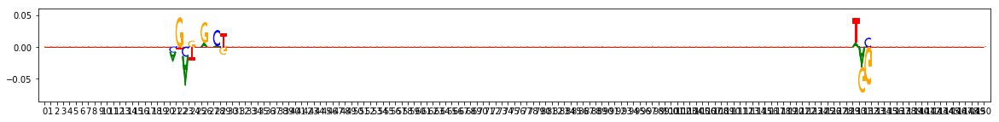

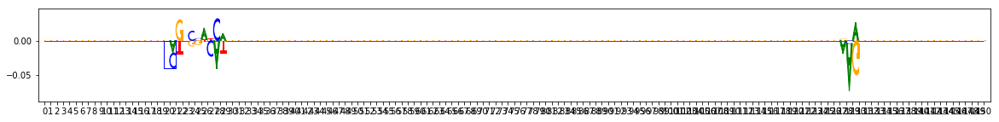

0: ACA


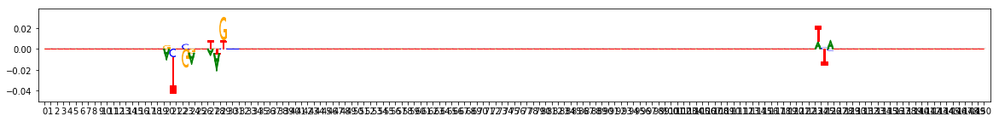

0: TAG


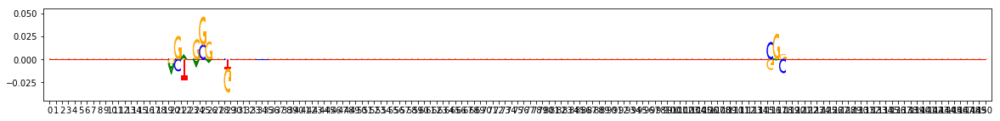

0: GCT


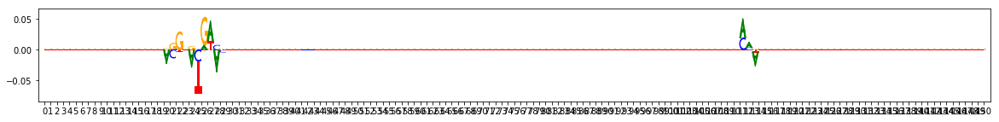

0: GGG


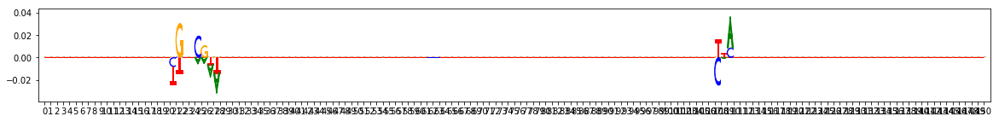

0: CGA


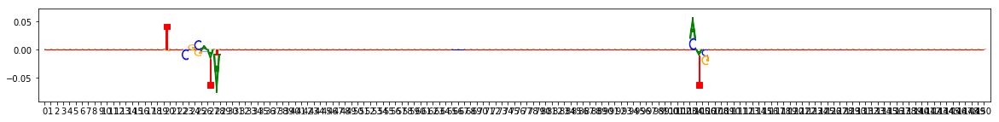

0: AAA


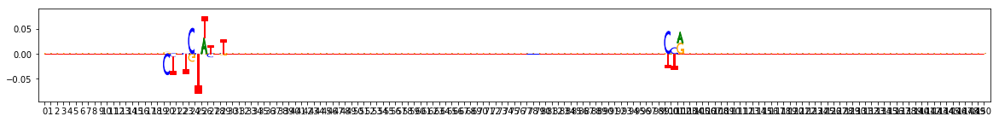

0: GAA


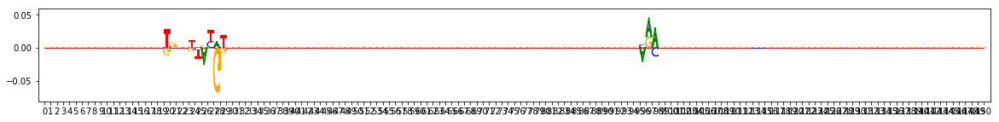

0: TGA


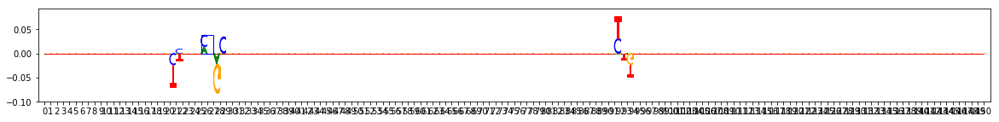

0: ACG


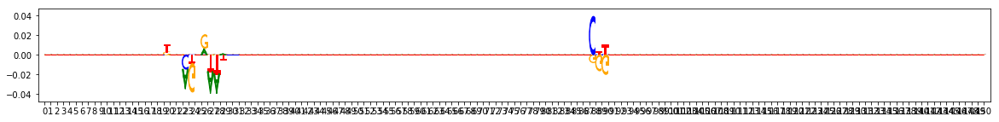

0: CGG


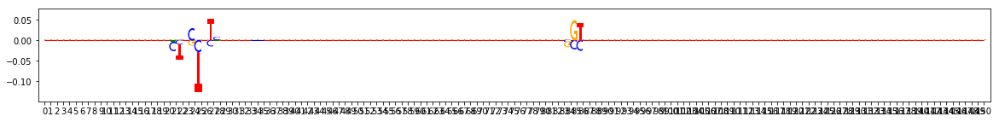

0: TTA


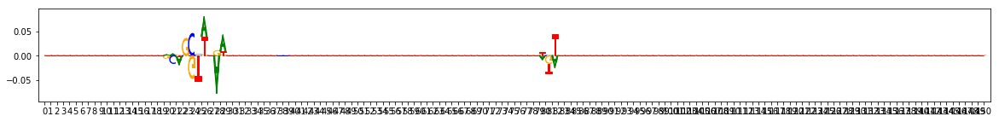

0: AAG


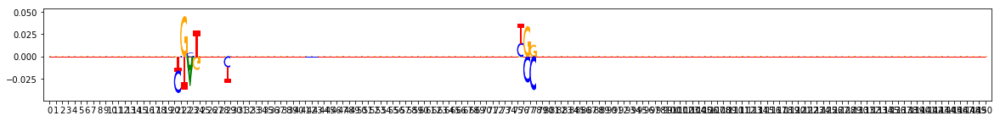

0: CGC


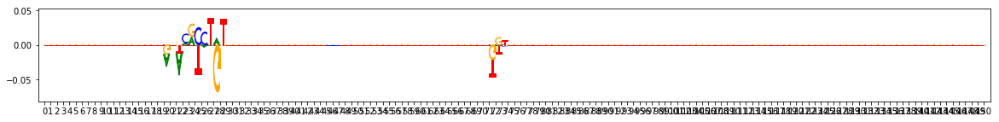

0: GAG


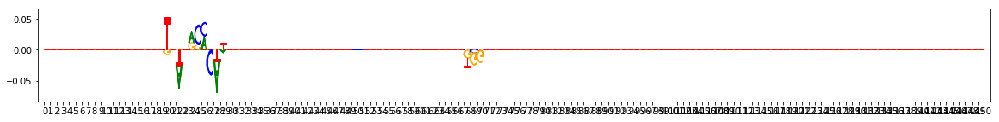

0: GGG


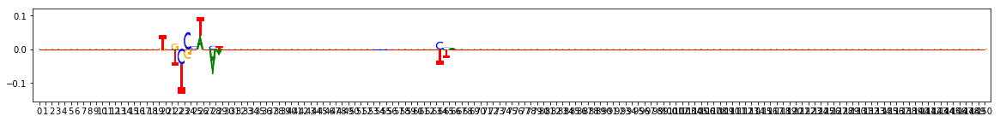

0: GAC


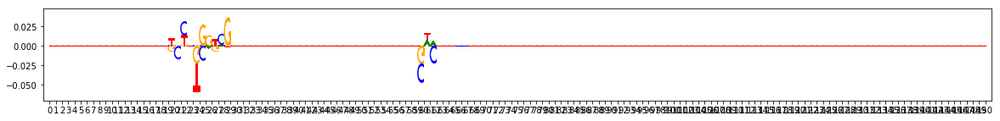

0: ACG


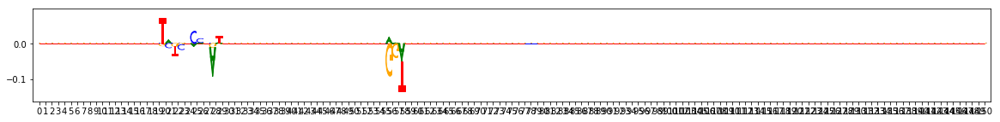

0: CCT


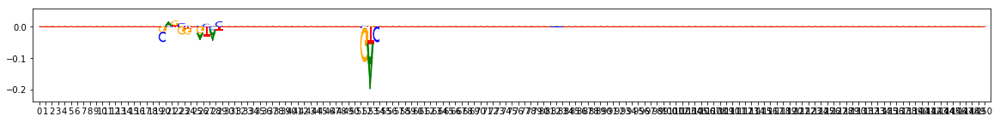

0: CGT


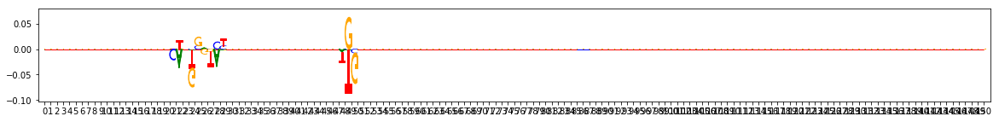

0: CGT


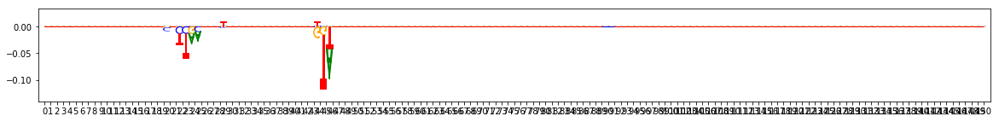

0: CTC


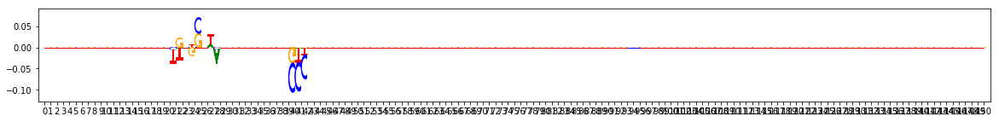

0: TCT


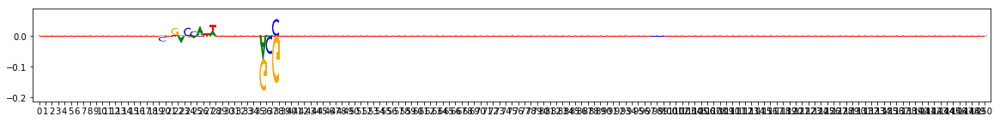

0: CGA


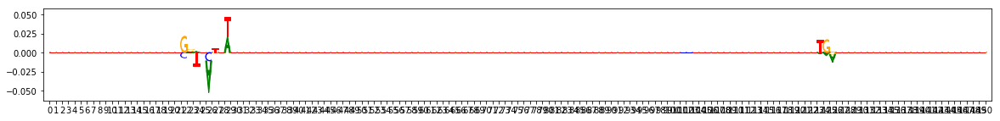

0: ACG


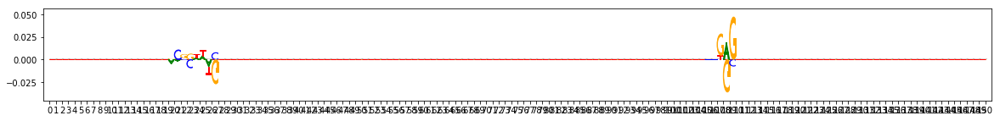

0: AGA


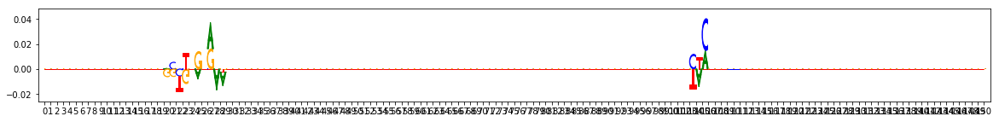

0: GTG


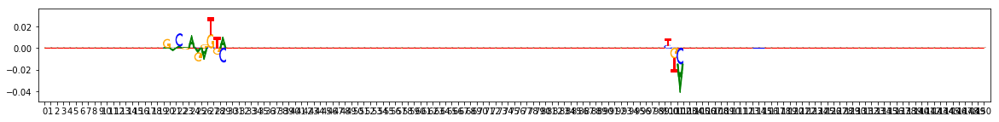

0: CTC


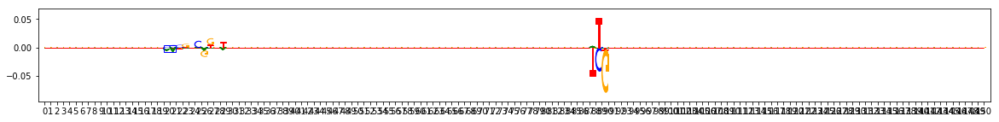

0: GAG


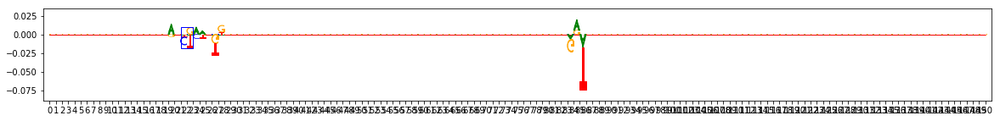

0: GCC


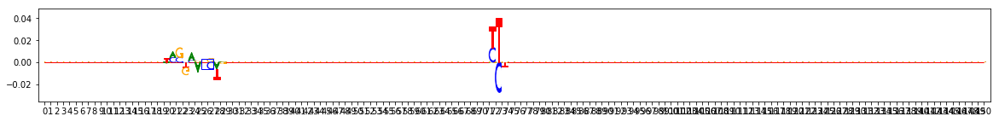

0: AAT


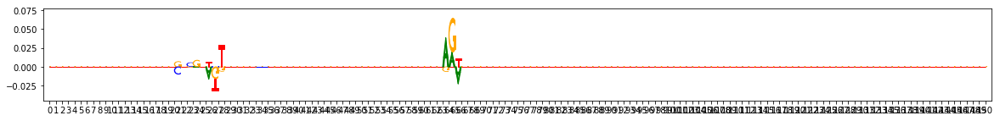

0: TGG


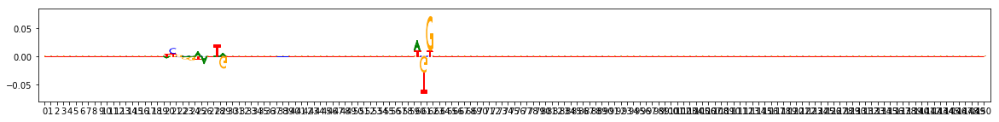

0: CCG


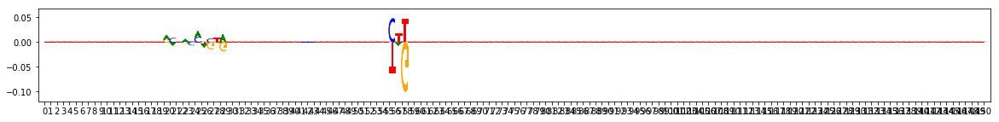

0: CGG


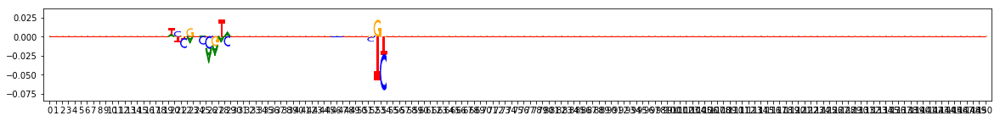

0: TTT


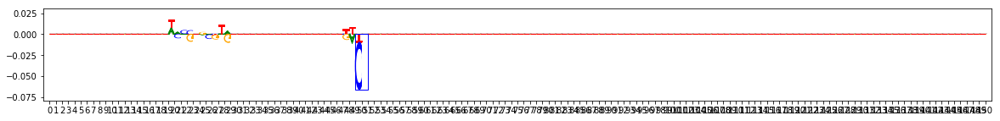

0: CTG


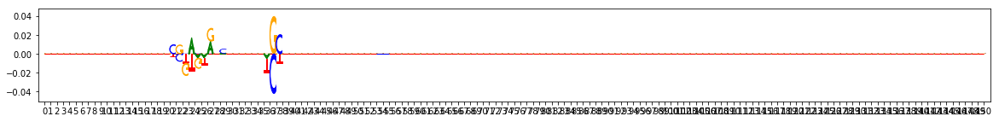

0: CAA


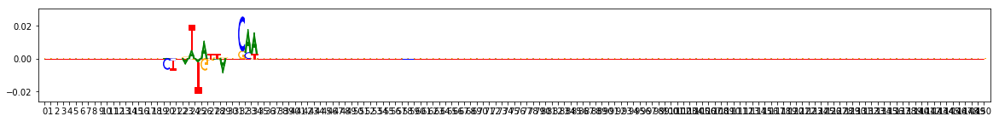

0: TTG


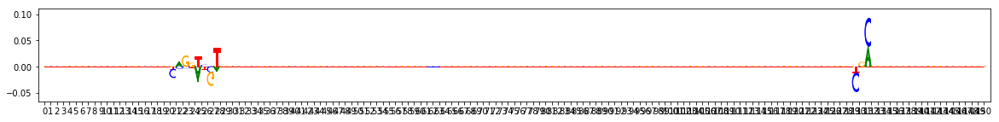

0: CCT


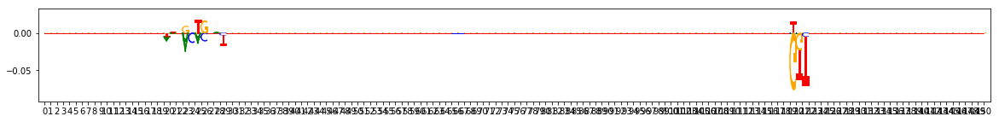

0: TAG


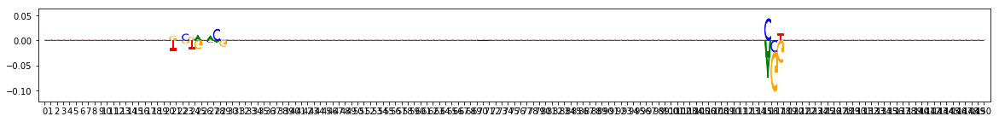

0: GAT


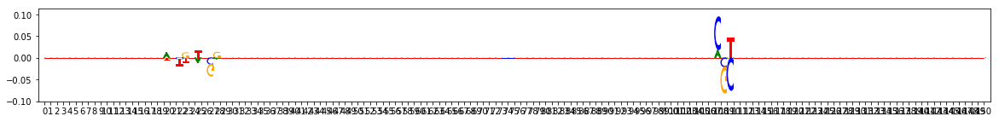

0: TTC


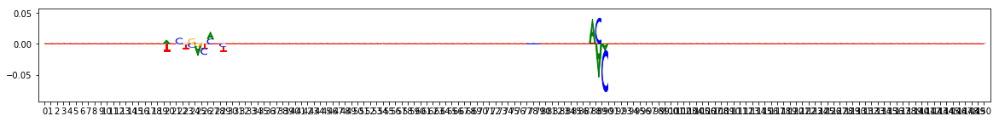

0: GGT


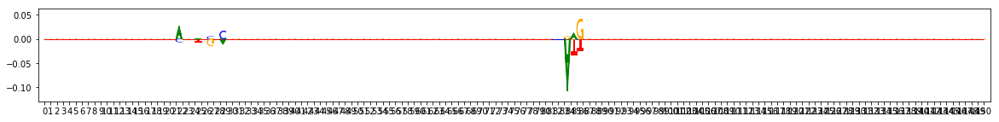

0: TGG


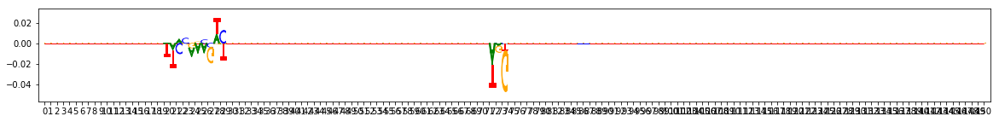

0: TCG


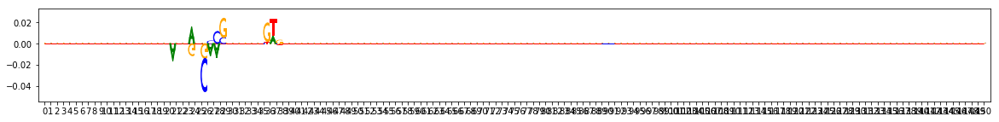

0: GTT


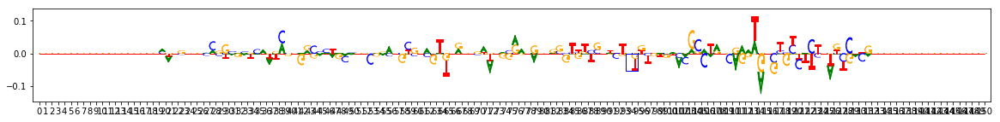

0: GCA


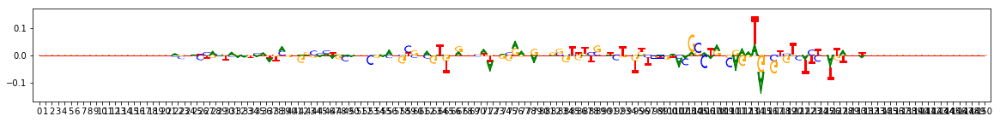

0: AGT


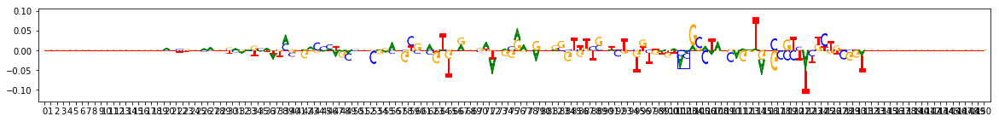

0: GGC


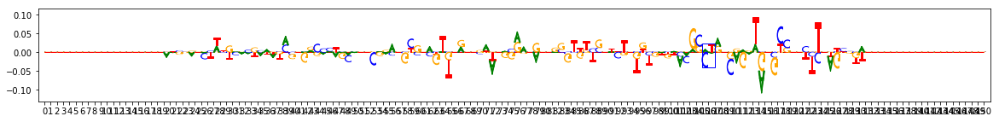

0: GGC


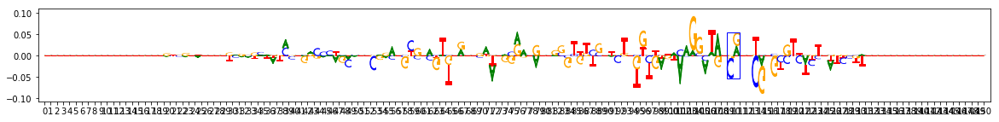

0: ACA


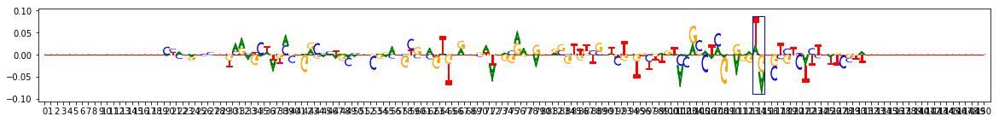

0: ACC


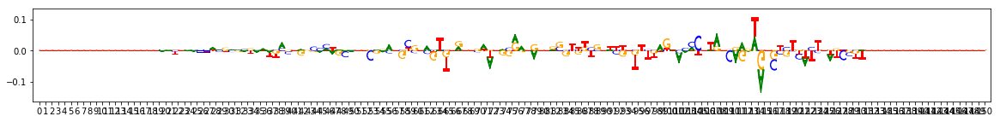

0: CTT


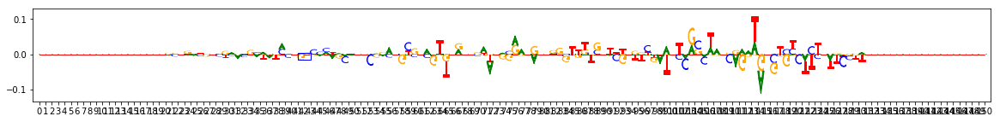

0: CCA


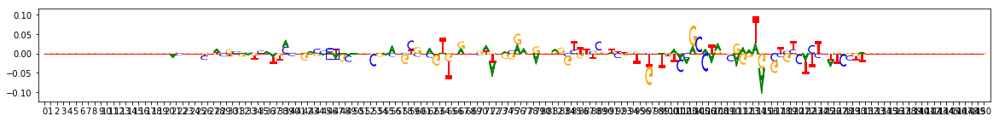

0: TTT


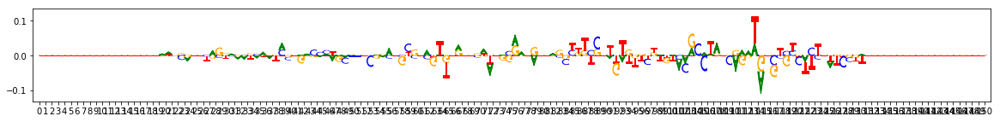

0: TTT


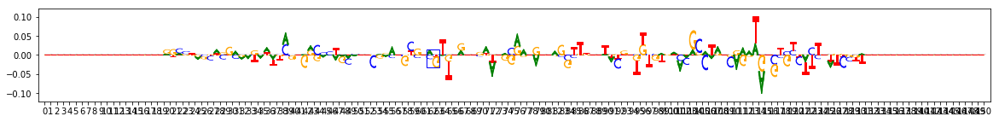

0: TCA


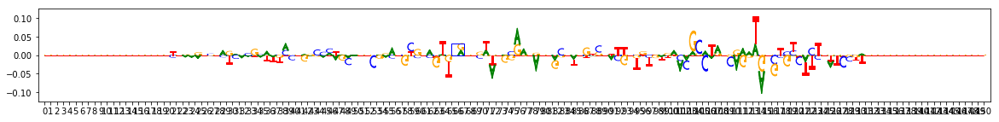

0: TGA


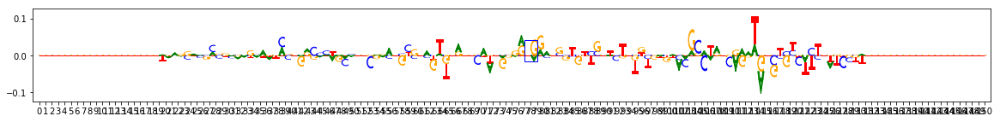

0: ATG


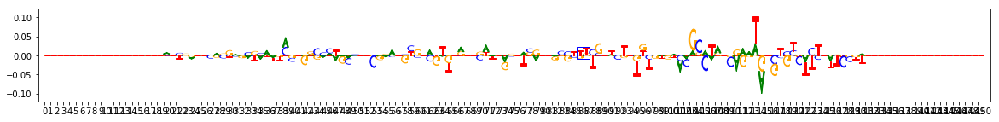

0: AAT


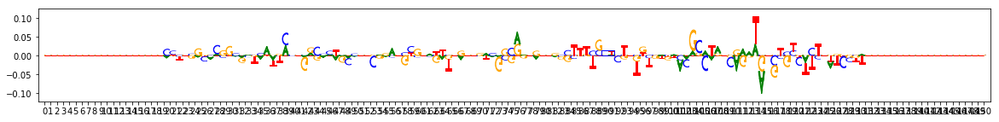

0: TTT


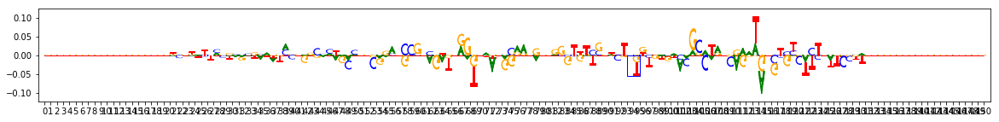

0: ATT


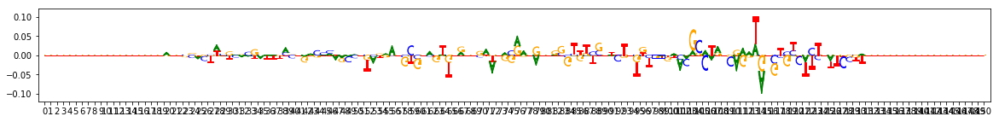

0: GTC


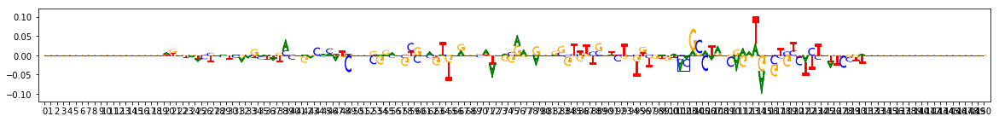

0: CTT


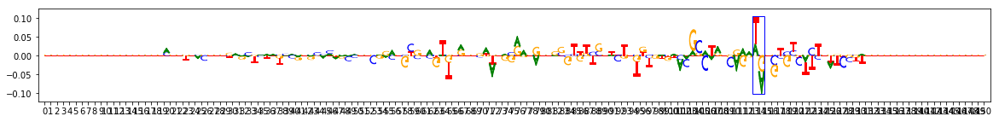

0: CTG


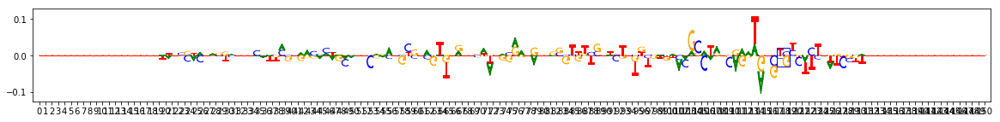

0: ATA


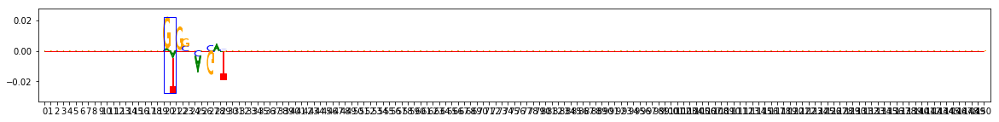

0: CAC


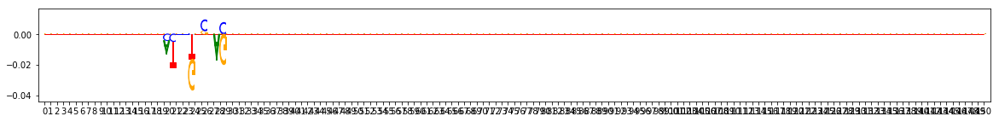

0: ACG


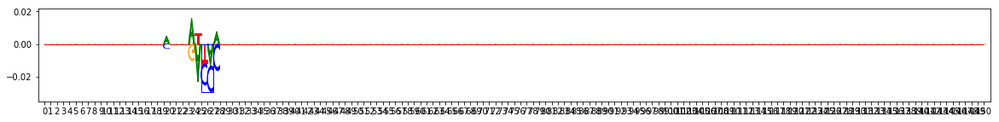

0: AAA


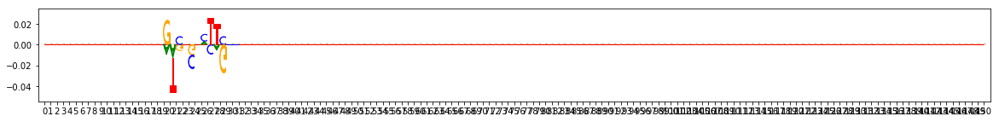

0: GCA


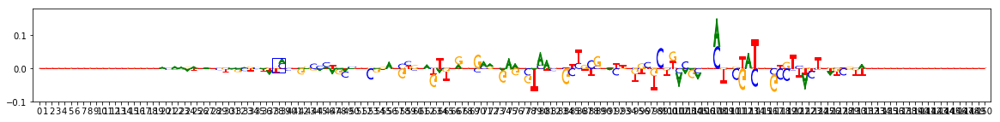

0: TCG


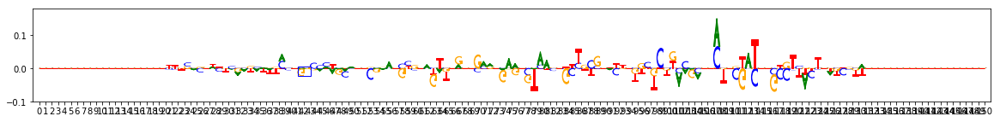

0: AAC


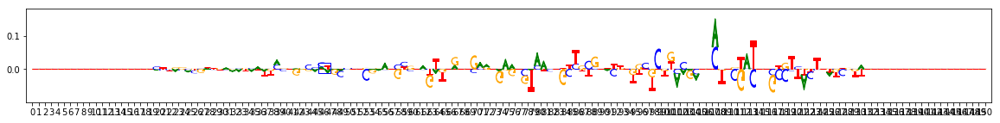

0: CTA


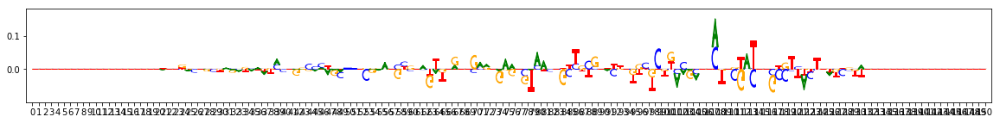

0: AGG


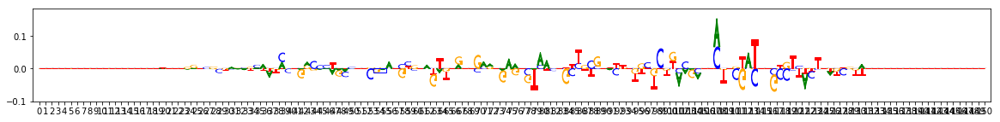

0: AGC


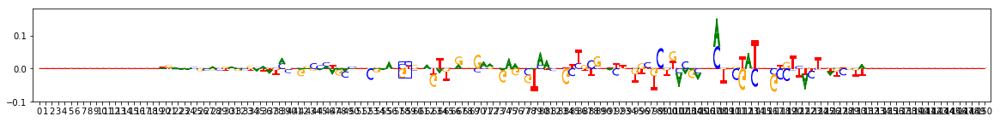

0: CCC


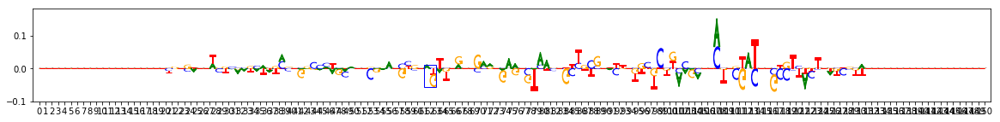

0: ATT


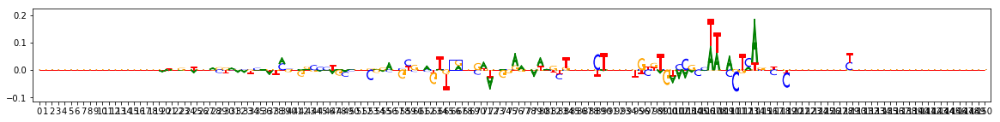

0: AGA


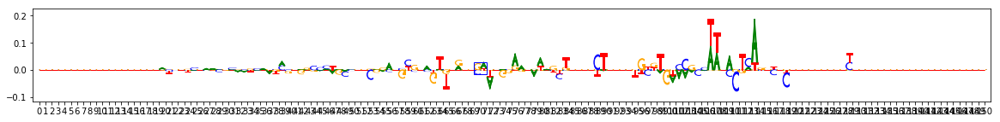

0: CTT


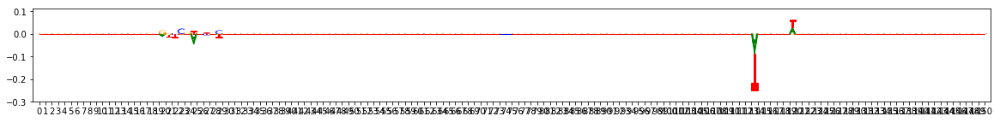

0: ACA


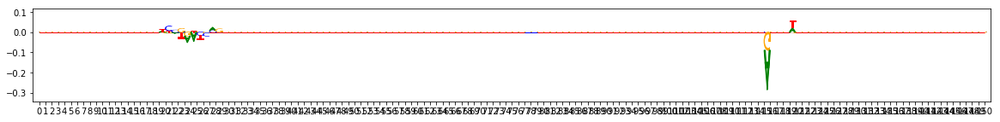

0: GGA


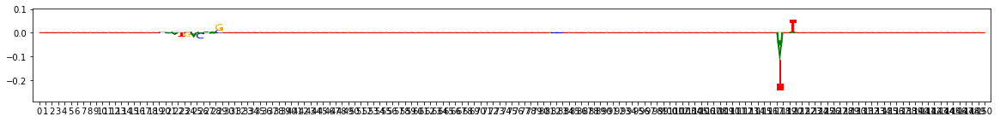

0: AGC


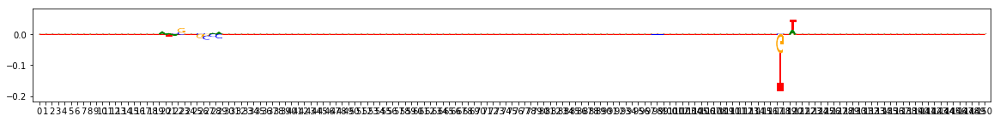

0: GAG


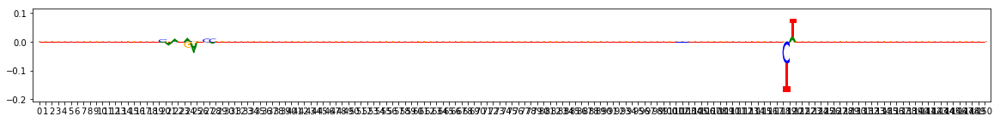

0: AAG


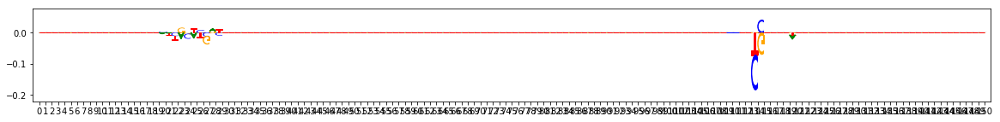

0: GAA


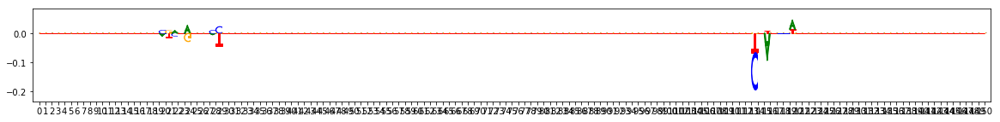

0: CGC


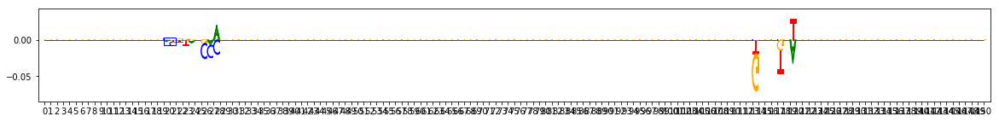

0: GAC


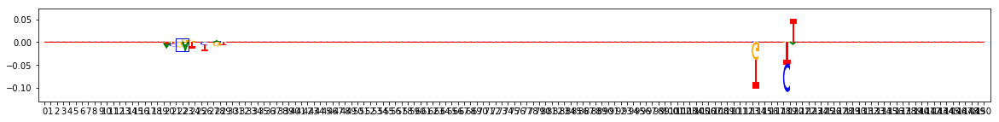

0: GAT


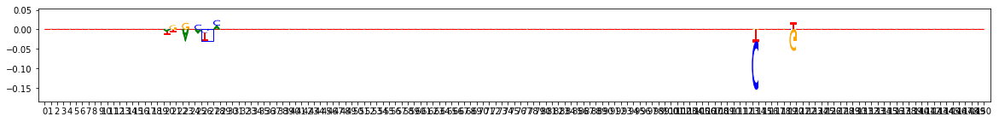

0: TCC


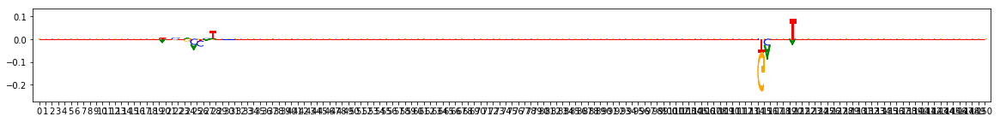

0: AAG


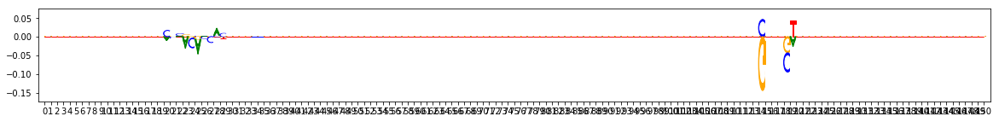

0: CGG


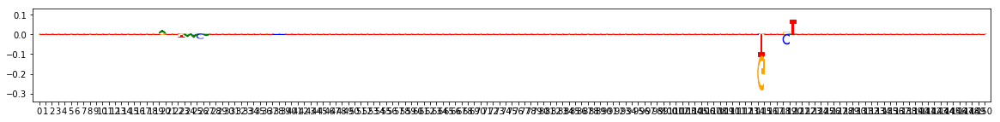

0: CAG


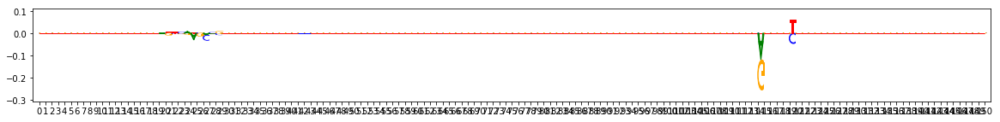

0: CAG


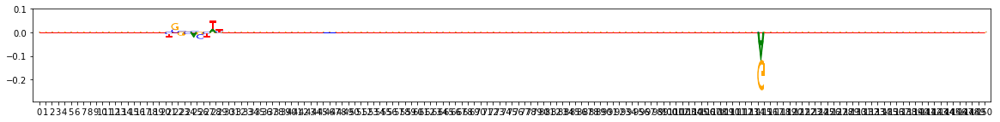

0: GAC


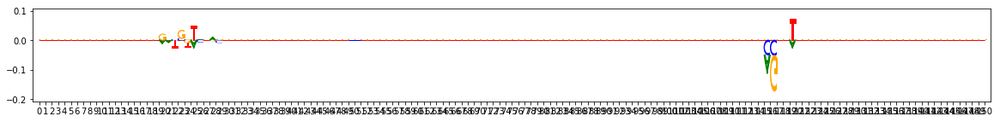

0: GCC


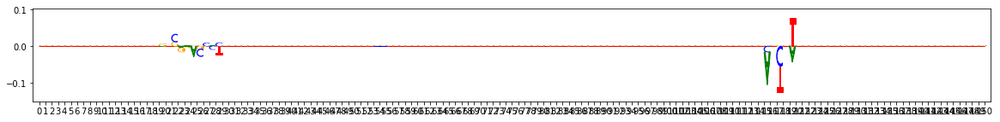

0: TGA


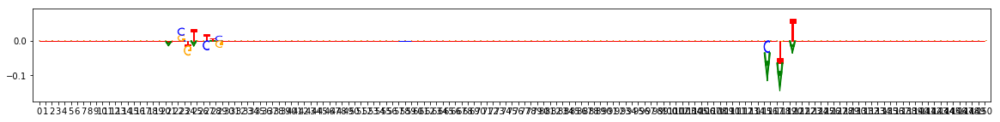

0: AGA


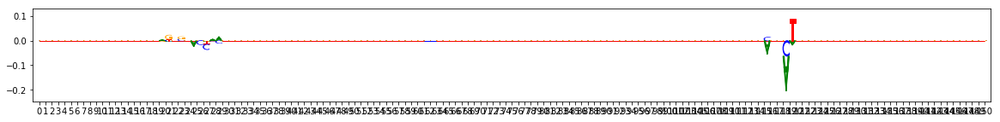

0: AAG


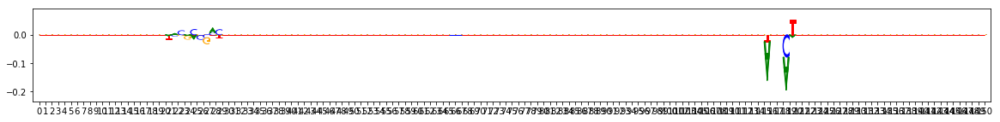

0: CTC


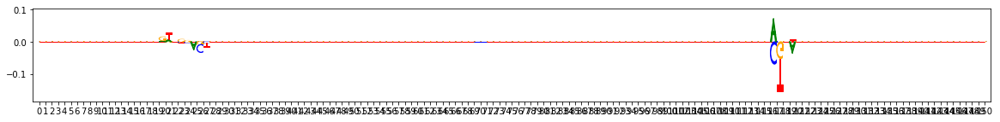

0: CCT


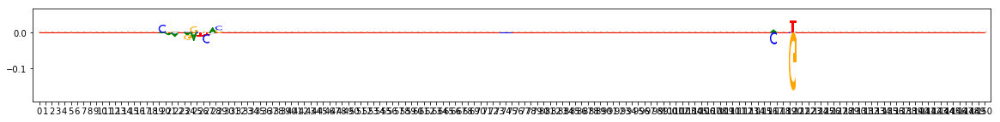

0: GCA


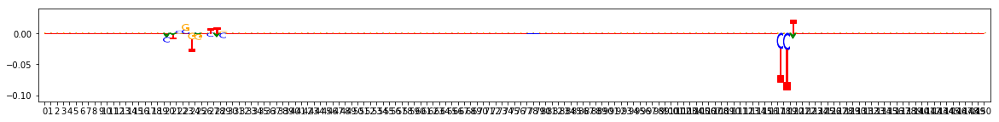

0: CGT


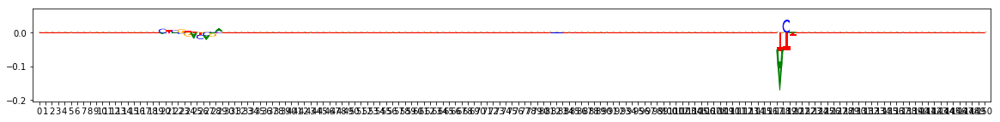

0: CTC


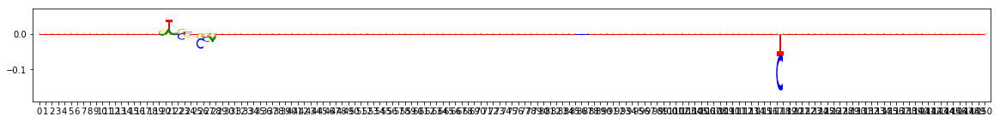

0: TCT


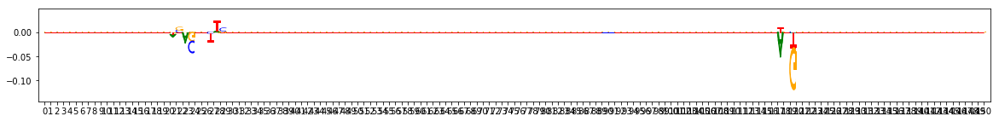

0: CAC


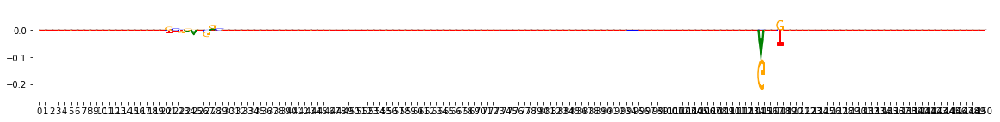

0: GGT


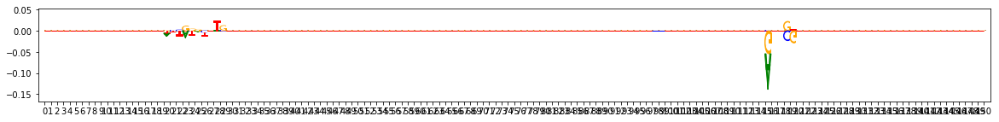

0: GCG


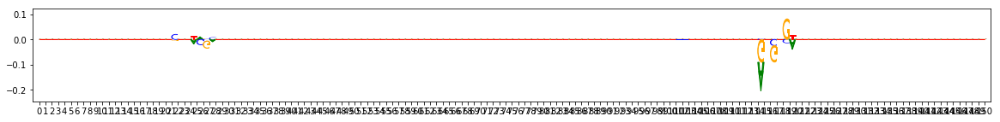

0: TCC


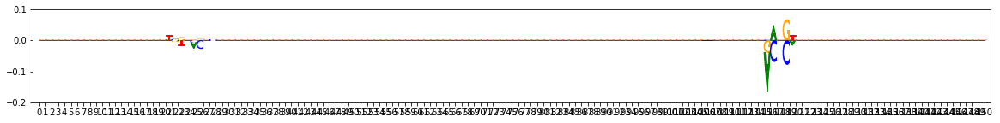

0: GAA


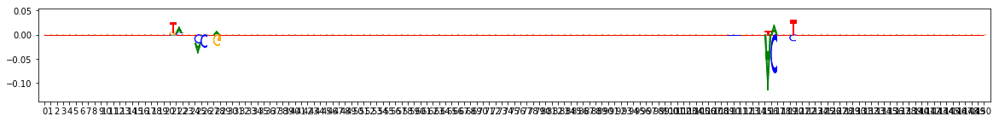

0: CGC


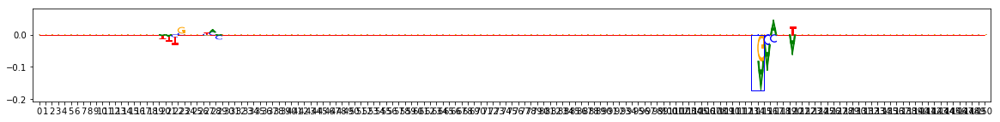

0: GAT


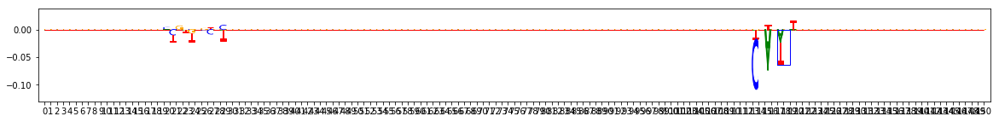

0: TGC


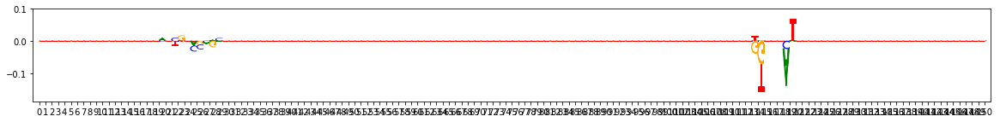

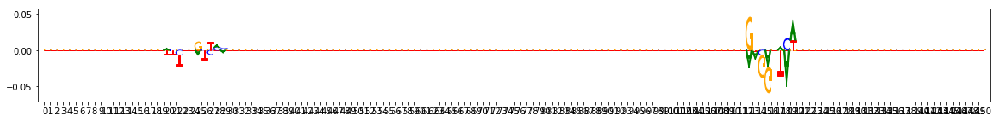

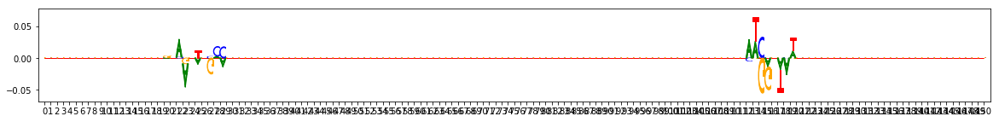

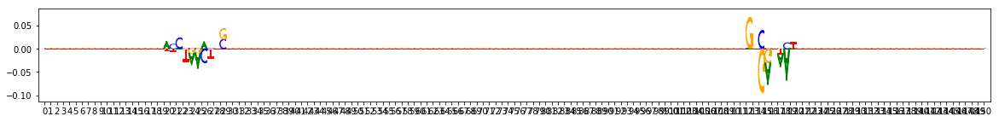

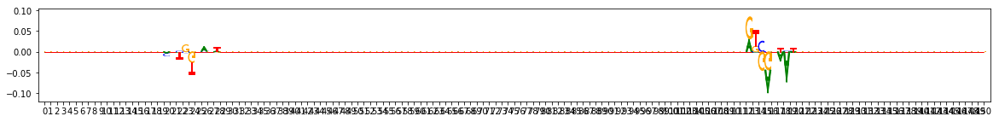

...

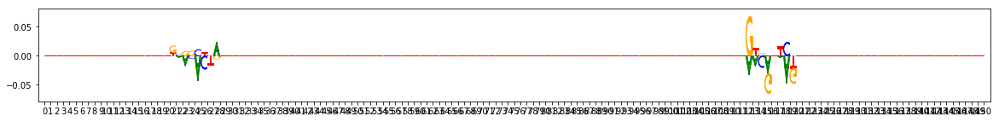

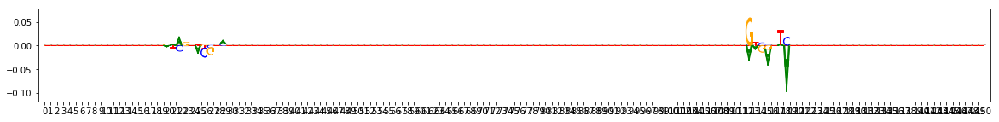

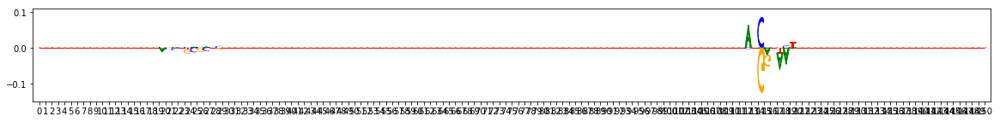

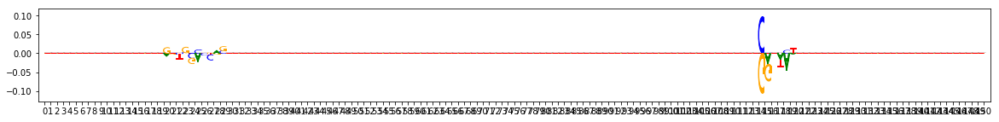

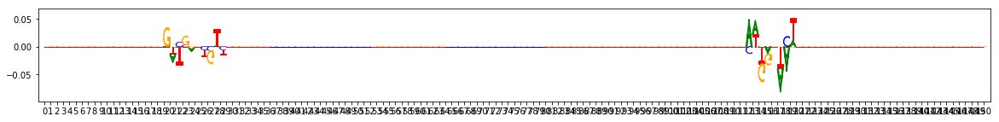

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


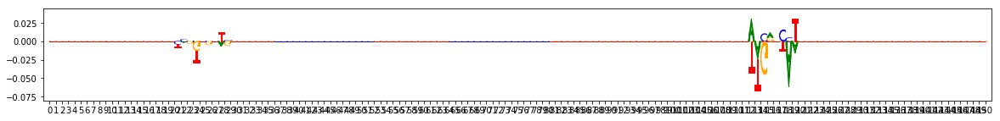

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


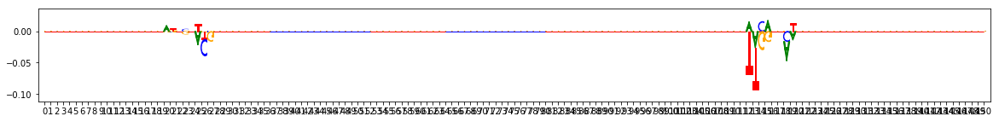

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


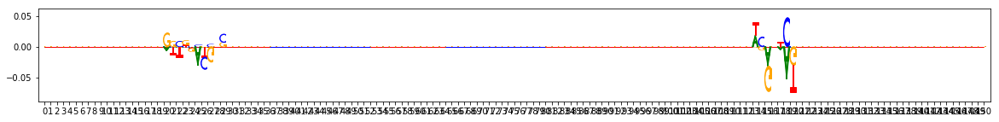

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


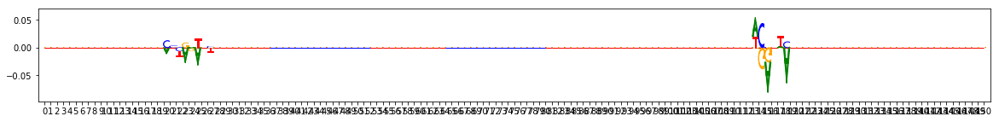

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


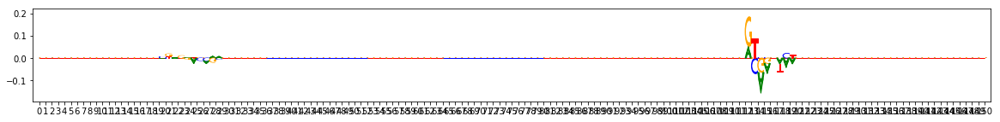

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


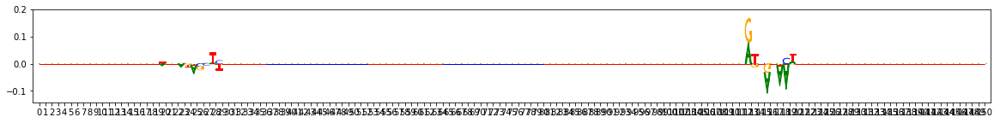

0: ATCGGAACCCTAAAGGG
1: TAGAGCCGGAAGACTCT


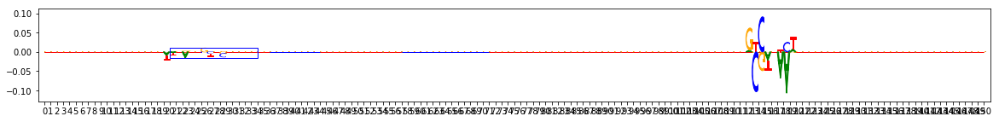

0: ACAGTCCGGGCACTA
1: ATCGGAACC
2: CCCGATTTAGAGCTT


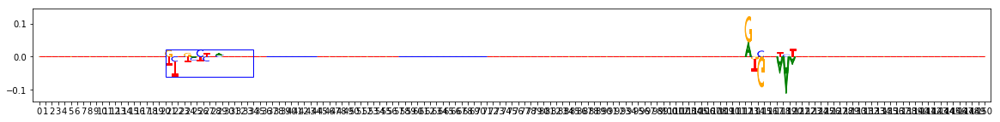

0: CTGTCCAGAGCACTA
1: ATCGGAACC
2: CCCGATTTAGAGCTT


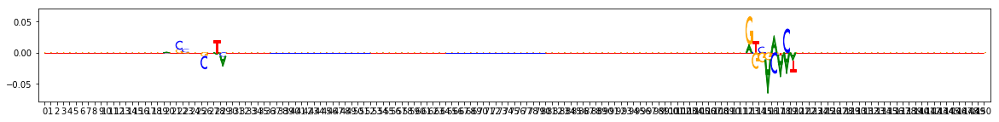

0: CCTCGTGACTCCTATAC
1: GATTTGCGGAAGACTCT


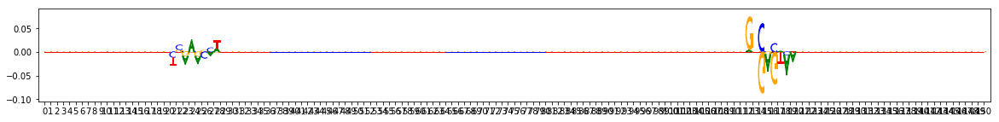

0: GACAAGCCAATAAATGT
1: TTTGATCGGAAGACTCT


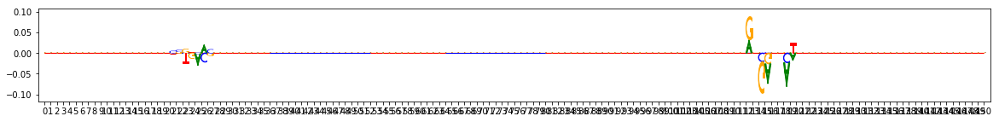

0: TTCGTTCGAATGCTCTG
1: ATATAGCGGAAGACTCT


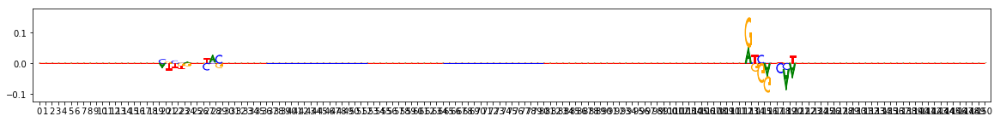

0: TGTAATCAAAATCAGGG
1: TTAGTTCGGAAGACTCT


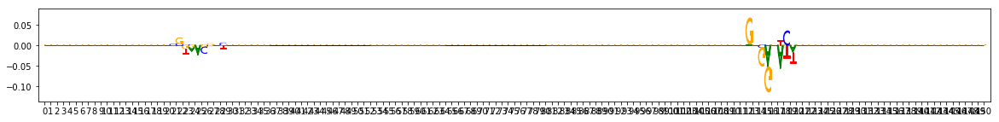

0: GTTGGTTACATTATTAC
1: ACTCAACGGAAGACTCT


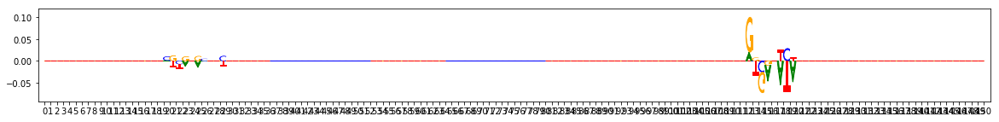

0: AGTCTAATTAACTATTA
1: CTACGCCGGAAGACTCT


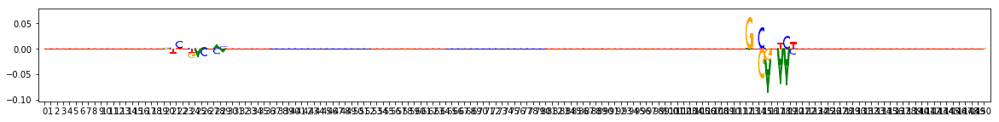

0: AGCTTTTACTAGAGCTT
1: CCCAGACGGAAGACTCT


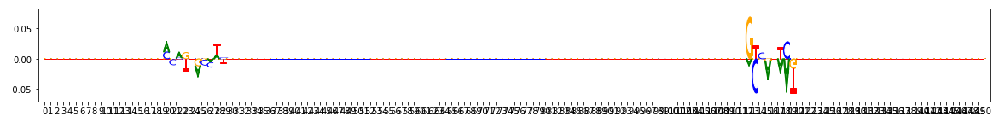

0: GAAAACCTCCTCGAATA
1: GTTAGACGGAAGACTCT


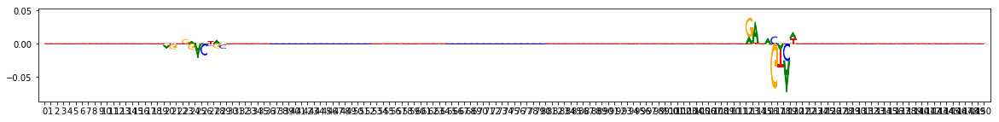

0: ACTATTCTAACAGCCTG
1: CATCTACGGAAGACTCT


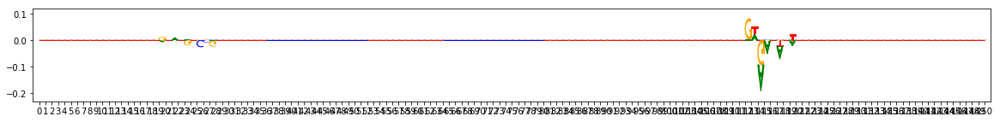

0: GTCGTTCGCGAATAAAA
1: TGGTAACGGAAGACTCT


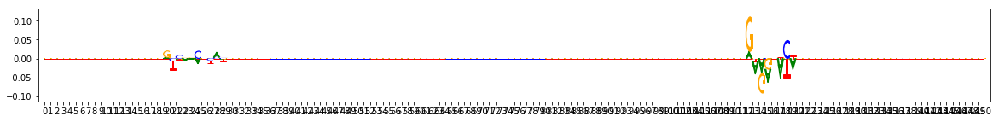

0: CAAACAGGCTCGTTACA
1: AACCTTCGGAAGACTCT


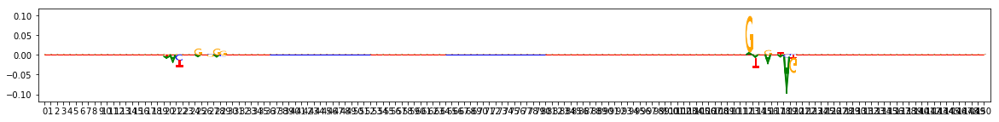

0: GGTTCTGCCTGTCAATT
1: ATCTGACGGAAGACTCT


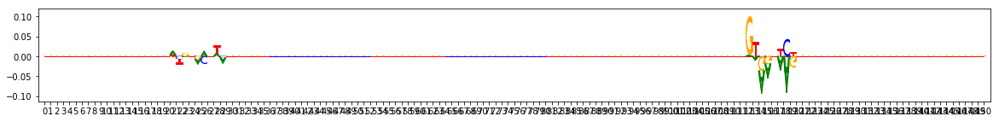

0: AACATAGTCCAATTTAG
1: TTTTCTCGGAAGACTCT


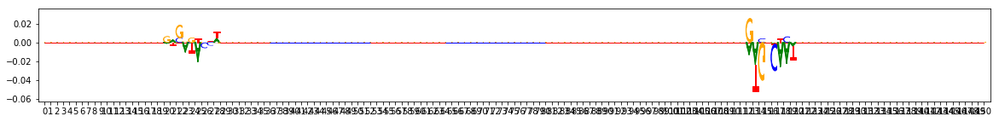

0: GTAAACTTACACAGGCT
1: AAATCTCGGAAGACTCT


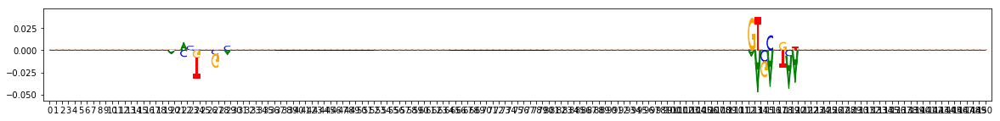

0: TGTCATACCATCAATCA
1: ATCTTCCGGAAGACTCT


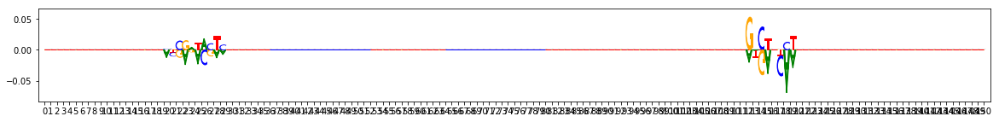

0: TAGCGGAATCAAAAGAT
1: AACAAACGGAAGACTCT


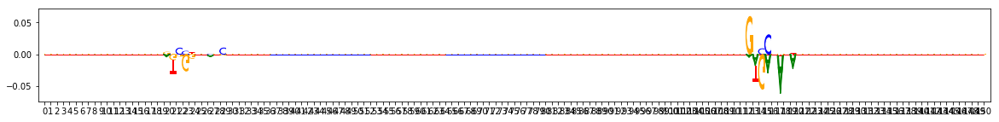

0: AAGTGCTGGCTTGGCGA
1: AGCTACCGGAAGACTCT


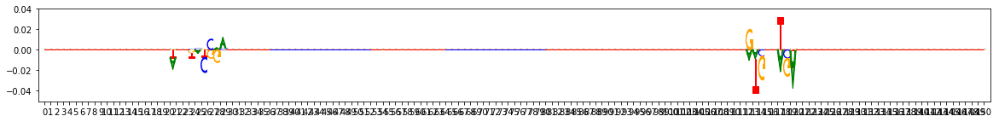

0: TTTCTTTCATCGCATAT
1: ATAGCCCGGAAGACTCT


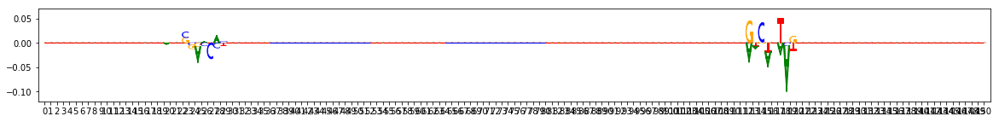

0: TCAAGATCCTTTCCCCC
1: TAAATACGGAAGACTCT


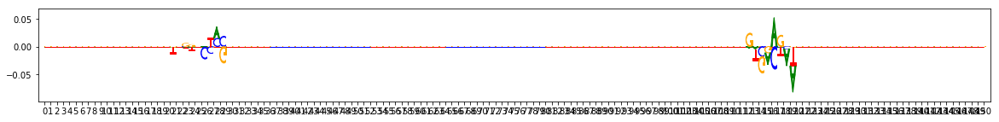

0: CATGTTTTTCTCTGCTG
1: CTATTCCGGAAGACTCT


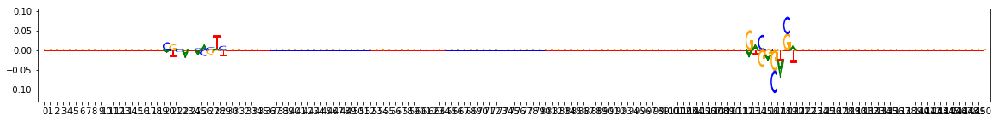

0: ATCCGAATAGAAACGGC
1: AAGAATCGGAAGACTCT


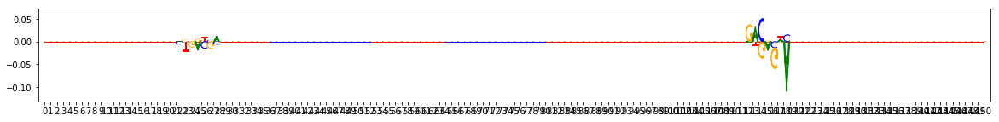

0: GCTTGATTCAGATATAC
1: GTCCCTCGGAAGACTCT


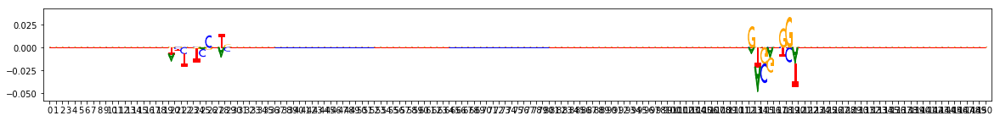

0: CTCAGAAAAAGCAAGGT
1: AGTAAACGGAAGACTCT


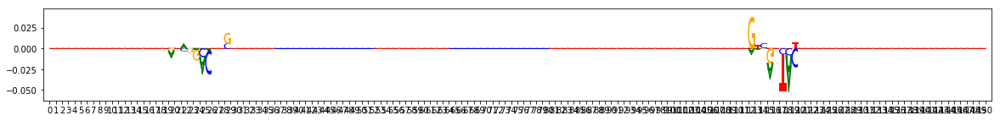

0: TTTATAGAGTTTCATAG
1: TAATGACGGAAGACTCT


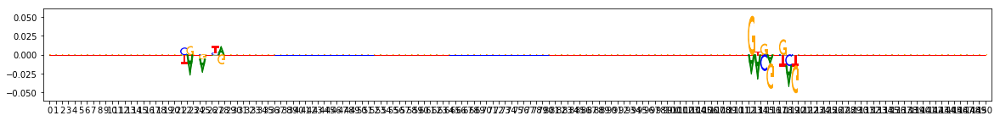

0: AAAGTTTTTATTTAAAT
1: AGCGAACGGAAGACTCT


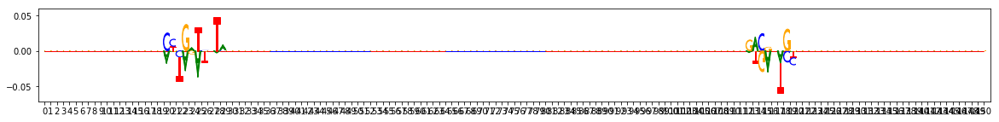

0: TAAAAAAGTGAATCTCC
1: AAATTTCGGAAGACTCT


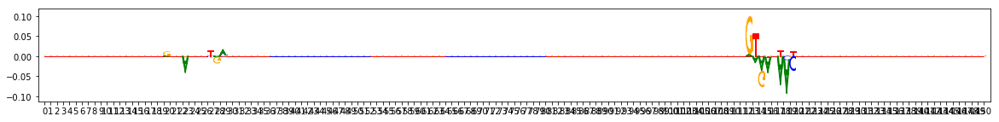

0: TCTATTAAACATCGTTA
1: ATTACTCGGAAGACTCT


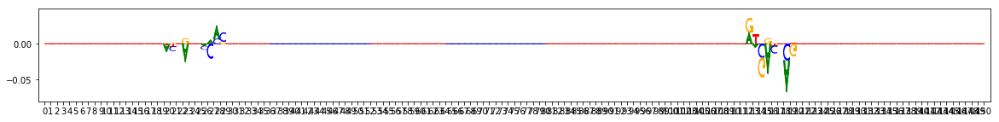

0: AAAAATTACCACTTCTG
1: GTTTTGCGGAAGACTCT


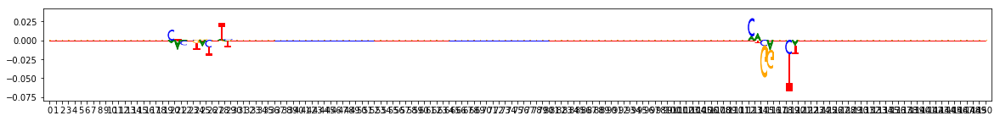

0: CGGAAACAGAAAGAAAA
1: ATTTTTCGGAAGACTCT


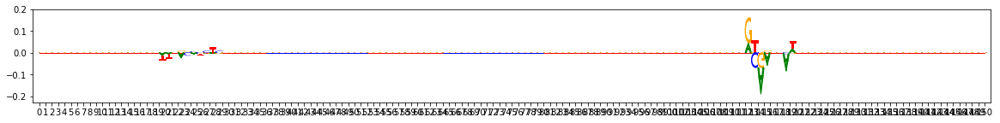

0: TCGTCACTGTCATTAGA
1: AAAGTTCGGAAGACTCT


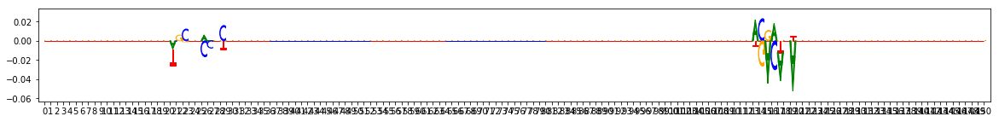

0: ATTTCTTACCATATTAG
1: TCGTAACGGAAGACTCT


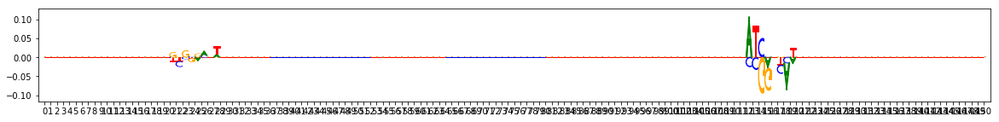

0: ACGAGCAGAAACTCAAG
1: TATCGACGGAAGACTCT


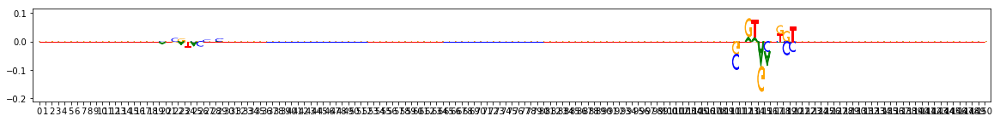

0: GGTTGAAAGAAAGTATG
1: GACCATCGGAAGACTCT


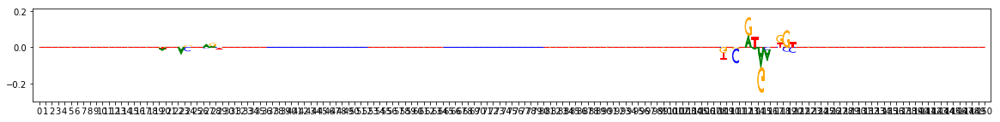

0: AAGAAAAGCAGTGGAAG
1: AACTTGCGGAAGACTCT


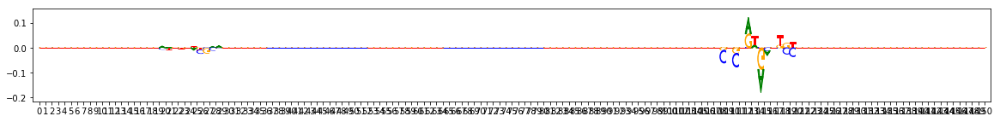

0: TAATAGACGTTACGAAG
1: AAGGGTCGGAAGACTCT


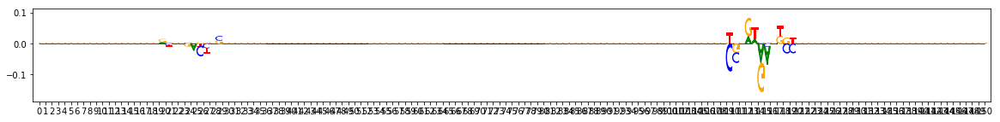

0: AGCATTGTTTCCTTGGT
1: TACCTGCGGAAGACTCT


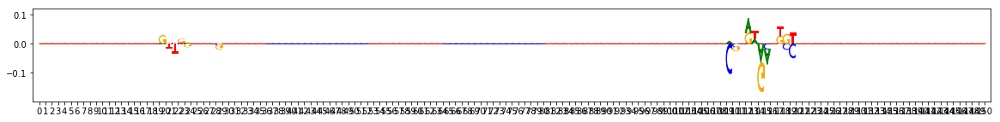

0: TCTTCTGATAAAAAGAA
1: CTTGGACGGAAGACTCT


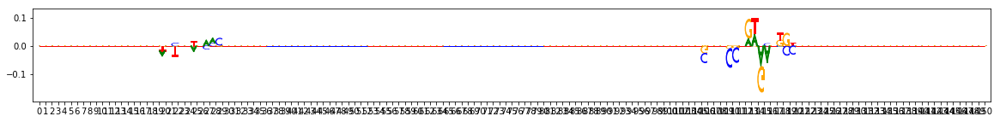

0: CAGAAACTATGGATTTA
1: ATCTCACGGAAGACTCT


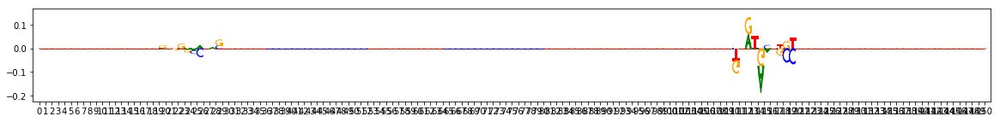

0: GGTACCAGGAAATGAAA
1: CAAAAACGGAAGACTCT


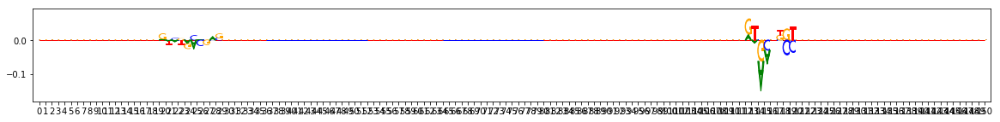

0: CCGCTATCGCCGGTAAT
1: TGAAGTCGGAAGACTCT


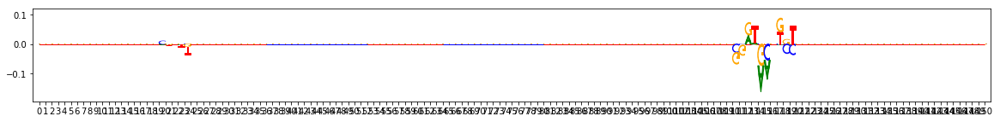

0: CAAGTTCGTACTACACC
1: AGAATGCGGAAGACTCT


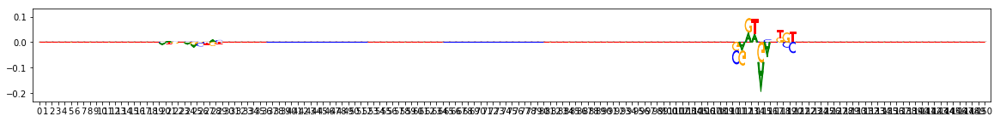

0: GACTCTACTGTCTGGAT
1: ATAAATCGGAAGACTCT


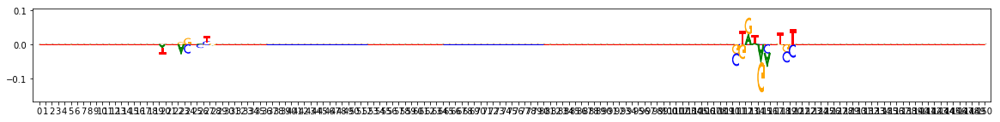

0: AAATAGACAATGCAGCG
1: TCTTTCCGGAAGACTCT


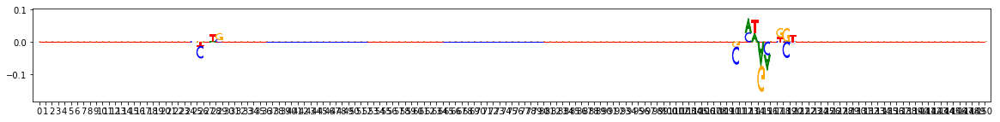

0: TCAAACCAGTGGTGCTG
1: CCTGCCCGGAAGACTCT


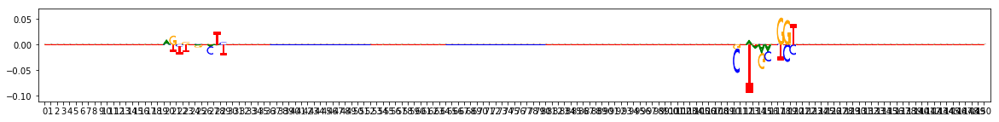

0: AGATCTTAATGTACAGC
1: AATACACGGAAGACTCT


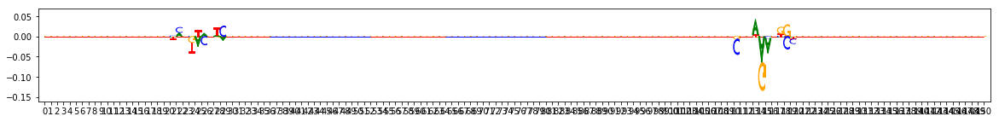

0: GATGAAGTAATTGCGGA
1: AATTGCCGGAAGACTCT


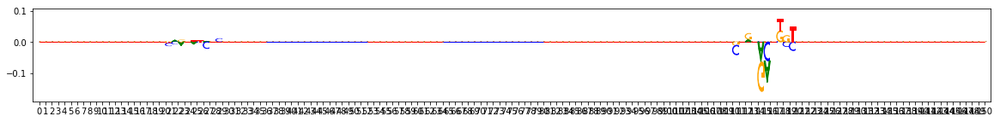

0: AGAATCTGTCGAAGCCT
1: TTATTTCGGAAGACTCT


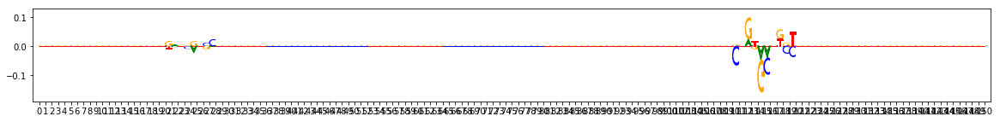

0: AAGGCTATATCACTTGG
1: CAGTTACGGAAGACTCT


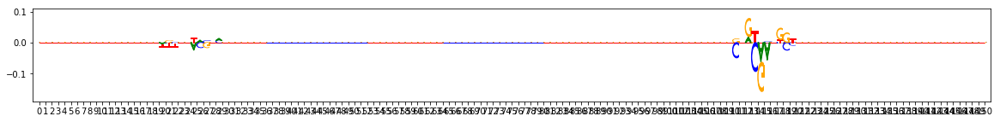

0: TGATCACATTCCATCAC
1: ATCTGCCGGAAGACTCT


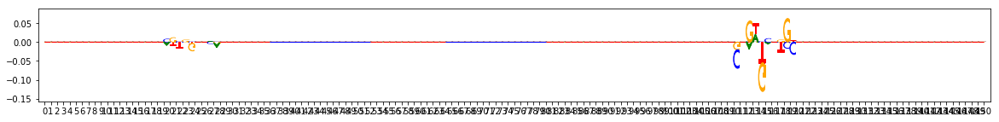

0: TCATCGAATAGAAGATT
1: TTCTTTCGGAAGACTCT


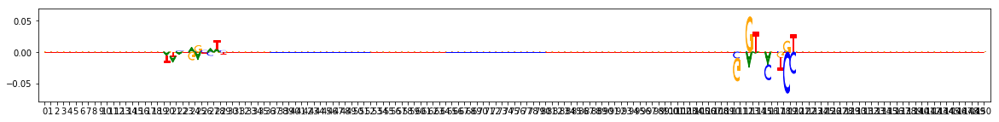

0: TTTGAGTTCTCTACGCC
1: GCCGTACGGAAGACTCT


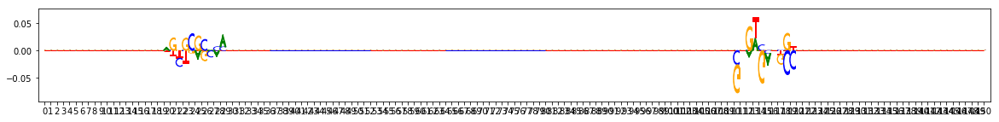

0: AAAATTGGATTACCCGG
1: TCTCACCGGAAGACTCT


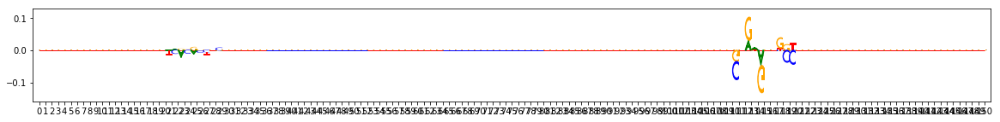

0: TATTAAAGTATTTTTGA
1: CTGCCTCGGAAGACTCT


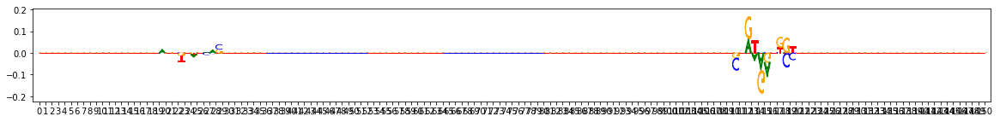

0: ATAGTTAGGACACTGAT
1: AGGGAACGGAAGACTCT


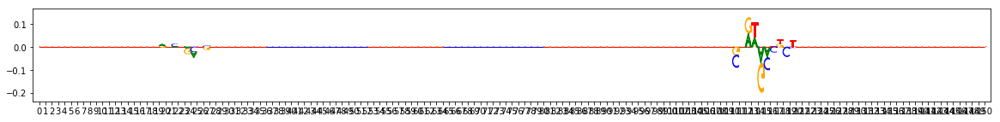

0: GGGGCATAATCTGGGTT
1: ACAAGTCGGAAGACTCT


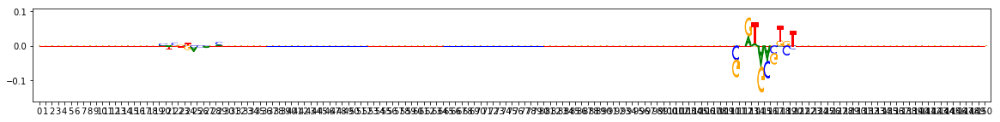

0: TAATGAATTATTAAATT
1: CGTCTTCGGAAGACTCT


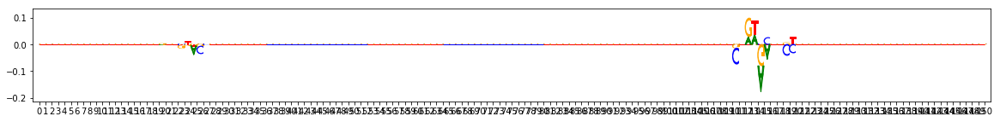

0: GTATATCAATATTTTTA
1: TCCTGACGGAAGACTCT


In [7]:
t.plotDeepLift(scores, num=200, verbose=True)

On task task0
Computing windowed sums on original
Generating null dist
peak(mu)= 3.725010901692522e-08
Computing threshold
Thresholds from null dist were -9.249895811080933e-06  and  0.3639317899942398
Passing windows frac was 0.5416840842898749 , which is above  0.2 ; adjusting
Final raw thresholds are -0.12711625546216965  and  0.12711625546216965
Final transformed thresholds are -0.8  and  0.8


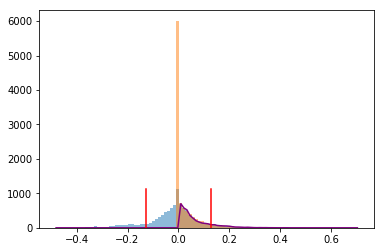

Got 8490 coords
After resolving overlaps, got 8490 seqlets
Across all tasks, the weakest transformed threshold used was: 0.7999999000000001
8490 identified in total
Reducing weak_threshold_for_counting_sign to match weakest_transformed_thresh, from 0.8 to 0.7999999000000001
2 activity patterns with support >= 100 out of 3 possible patterns
Metacluster sizes:  [4402, 4088]
Idx to activities:  {0: '-1', 1: '1'}
On metacluster 1
Metacluster size 4088
Relevant tasks:  ('task0',)
Relevant signs:  (1,)
TfModiscoSeqletsToPatternsFactory: seed=1234
(Round 1) num seqlets: 4088
(Round 1) Computing coarse affmat
Beginning embedding computation
Computing embeddings
Finished embedding computation in 11.8 s
Starting affinity matrix computations
Normalization computed in 0.91 s
Cosine similarity mat computed in 4.7 s
Normalization computed in 0.92 s
Cosine similarity mat computed in 4.81 s
Finished affinity matrix computations in 9.59 s
(Round 1) Compute nearest neighbors from coarse affmat
Computed 

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    3.5s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    4.8s finished


Louvain completed 200 runs in 11.321682929992676 seconds
Wrote graph to binary file in 2.110044240951538 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.915126
After 2 runs, maximum modularity is Q = 0.916268
After 7 runs, maximum modularity is Q = 0.916357
After 40 runs, maximum modularity is Q = 0.917078
After 51 runs, maximum modularity is Q = 0.917215
After 58 runs, maximum modularity is Q = 0.919339
Louvain completed 108 runs in 12.894070863723755 seconds
Preproc + Louvain took 27.818368911743164 s
Got 47 clusters after round 1
Counts:
{21: 61, 26: 53, 14: 86, 43: 18, 18: 71, 7: 138, 9: 135, 36: 33, 32: 38, 11: 115, 19: 70, 5: 162, 23: 57, 42: 18, 0: 265, 25: 53, 38: 30, 15: 82, 2: 206, 37: 32, 12: 111, 33: 37, 40: 24, 29: 45, 22: 57, 27: 50, 13: 98, 45: 16, 1: 225, 20: 66, 30: 43, 10: 116, 8: 137, 35: 33, 4: 179, 28: 50, 16: 81, 34: 35, 41: 21, 3: 182, 17: 77, 6: 142, 31: 42, 44: 17, 46: 11, 24: 57, 39: 27}
(Round 1) Aggregating seqlets i

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    3.2s finished


Louvain completed 200 runs in 5.39127254486084 seconds
Wrote graph to binary file in 0.9175143241882324 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.880491
After 32 runs, maximum modularity is Q = 0.882451
Louvain completed 82 runs in 11.305571794509888 seconds
Preproc + Louvain took 18.41252613067627 s
Got 38 clusters after round 2
Counts:
{12: 58, 1: 195, 2: 157, 26: 26, 6: 99, 3: 155, 17: 38, 4: 143, 0: 212, 11: 73, 37: 10, 7: 99, 10: 80, 31: 20, 34: 17, 9: 83, 29: 22, 18: 36, 16: 40, 25: 29, 22: 32, 5: 100, 8: 89, 15: 50, 28: 22, 13: 54, 23: 32, 24: 31, 36: 12, 14: 53, 32: 19, 20: 33, 30: 22, 19: 34, 21: 33, 27: 24, 33: 18, 35: 16}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 212 seqlets
Trimmed 0 out of 212
Skipped 212 seqlets
Aggregating for cluster 1 with 195 seqlets
Trimmed 14 out of 195
Dropping cluster 1 with 181 seqlets due to sign disagreement
Aggregating for cluster 2 with 157 seqlets
Trimmed 21 o

Wrote graph to binary file in 0.013601303100585938 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.03238
After 4 runs, maximum modularity is Q = 0.0327025
Louvain completed 24 runs in 2.915086030960083 seconds
Similarity is 0.7060454; is_dissimilar is True
Inspecting for spurious merging
Wrote graph to binary file in 0.010372638702392578 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.00115944
After 4 runs, maximum modularity is Q = 0.00298006
After 5 runs, maximum modularity is Q = 0.00298007
Louvain completed 25 runs in 2.6512560844421387 seconds
Similarity is 0.9131319; is_dissimilar is False
Got 2 subclusters
Inspecting for spurious merging
Wrote graph to binary file in 0.014782905578613281 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.0153208
Louvain completed 21 runs in 2.8693764209747314 seconds
Similarity is 0.8809502; is_dissimilar is False
Inspecting

/home/ryan/anaconda3/envs/ai/lib/python3.6/site-packages/modisco/affinitymat/core.py:863: RuntimeWarning: divide by zero encountered in log
  neg_log_pvals.append(-np.log(corr.pvalue))


Filtered down to 3876 of 4402
(Round 1) Retained 3876 rows out of 4402 after filtering
(Round 1) Computing density adapted affmat
[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3876 samples in 0.008s...
[t-SNE] Computed neighbors for 3876 samples in 0.167s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3876
[t-SNE] Computed conditional probabilities for sample 2000 / 3876
[t-SNE] Computed conditional probabilities for sample 3000 / 3876
[t-SNE] Computed conditional probabilities for sample 3876 / 3876
[t-SNE] Mean sigma: 0.169501
(Round 1) Computing clustering
Beginning preprocessing + Louvain
Wrote graph to binary file in 0.8161284923553467 seconds
Running Louvain modularity optimization


[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 144 tasks      | elapsed:    4.6s
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    6.2s finished


Louvain completed 200 runs in 15.187170028686523 seconds
Wrote graph to binary file in 3.59659743309021 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.841299
After 2 runs, maximum modularity is Q = 0.87177
After 3 runs, maximum modularity is Q = 0.880919
After 4 runs, maximum modularity is Q = 0.883115
After 6 runs, maximum modularity is Q = 0.883563
Louvain completed 56 runs in 9.349109888076782 seconds
Preproc + Louvain took 30.022367000579834 s
Got 47 clusters after round 1
Counts:
{36: 30, 20: 72, 29: 47, 23: 60, 0: 414, 21: 68, 39: 25, 7: 133, 30: 41, 9: 131, 34: 33, 8: 132, 4: 145, 42: 21, 35: 32, 18: 81, 22: 62, 12: 118, 6: 134, 25: 56, 3: 192, 33: 34, 13: 107, 10: 123, 19: 77, 37: 28, 17: 84, 15: 88, 2: 206, 27: 48, 45: 12, 26: 52, 14: 94, 28: 48, 38: 25, 41: 23, 43: 19, 11: 120, 31: 40, 5: 144, 44: 13, 16: 84, 32: 37, 40: 24, 24: 59, 1: 248, 46: 12}
(Round 1) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 414 seqle

[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done 200 out of 200 | elapsed:    2.4s finished


Louvain completed 200 runs in 2.9686057567596436 seconds
Wrote graph to binary file in 0.38510727882385254 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.878064
After 19 runs, maximum modularity is Q = 0.879309
After 25 runs, maximum modularity is Q = 0.879722
Louvain completed 75 runs in 11.296895980834961 seconds
Preproc + Louvain took 14.938026666641235 s
Got 22 clusters after round 2
Counts:
{11: 41, 14: 32, 5: 64, 0: 126, 2: 71, 16: 26, 12: 34, 4: 65, 7: 51, 15: 26, 1: 75, 19: 13, 9: 47, 20: 12, 3: 71, 10: 46, 18: 20, 6: 55, 8: 50, 13: 34, 17: 21, 21: 12}
(Round 2) Aggregating seqlets in each cluster
Aggregating for cluster 0 with 126 seqlets
Trimmed 4 out of 126
Aggregating for cluster 1 with 75 seqlets
Trimmed 0 out of 75
Aggregating for cluster 2 with 71 seqlets
Trimmed 4 out of 71
Aggregating for cluster 3 with 71 seqlets
Trimmed 0 out of 71
Aggregating for cluster 4 with 65 seqlets
Trimmed 2 out of 65
Aggregating for cluster 5 with 6

After 1 runs, maximum modularity is Q = 0.0136224
After 6 runs, maximum modularity is Q = 0.0151924
After 11 runs, maximum modularity is Q = 0.0164189
After 13 runs, maximum modularity is Q = 0.0168387
After 16 runs, maximum modularity is Q = 0.0170149
Louvain completed 36 runs in 6.171953439712524 seconds
Similarity is 0.79507315; is_dissimilar is True
Inspecting for spurious merging
Wrote graph to binary file in 0.009832382202148438 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.0134207
After 5 runs, maximum modularity is Q = 0.0137516
Louvain completed 25 runs in 3.811394691467285 seconds
Similarity is 0.92445594; is_dissimilar is False
Got 2 subclusters
Inspecting for spurious merging
Wrote graph to binary file in 0.015292167663574219 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.0162003
Louvain completed 21 runs in 3.2977402210235596 seconds
Similarity is 0.89039457; is_dissimilar is False
Inspe

In [8]:
tfmodisco = t.tfmodiscoResults(scores, hypothetical_scores)

## TFModisco Visualization

Added small loop through seqlets to find which examples they corresponded to. Aggregated all labelled samples into an `ids` set.

Metaclusters heatmap


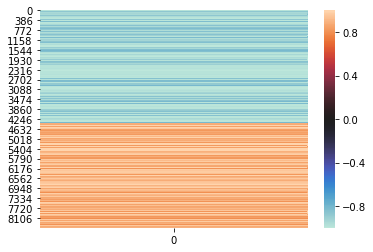

metacluster_0
activity pattern: [-1]
metacluster_0 pattern_0
Task 0 hypothetical scores:


/home/ryan/anaconda3/envs/ai/lib/python3.6/site-packages/h5py/_hl/dataset.py:313: H5pyDeprecationWarning: dataset.value has been deprecated. Use dataset[()] instead.
  "Use dataset[()] instead.", H5pyDeprecationWarning)


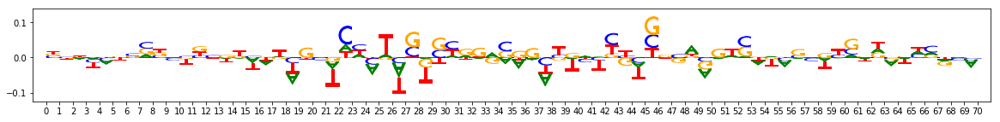

Task 0 actual importance scores:


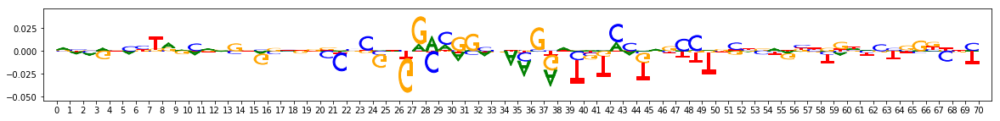

onehot, fwd and rev:


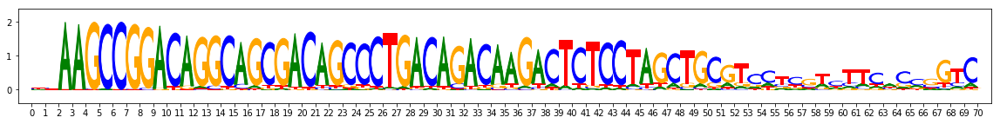

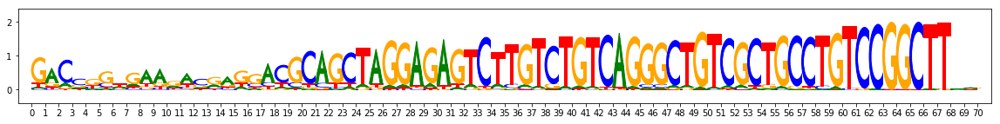

metacluster_0 pattern_1
Task 0 hypothetical scores:


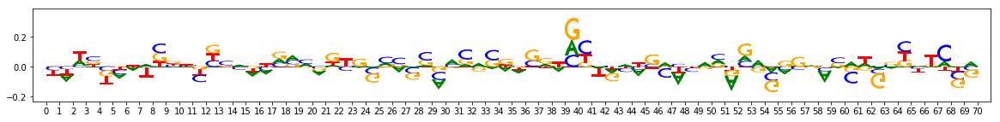

Task 0 actual importance scores:


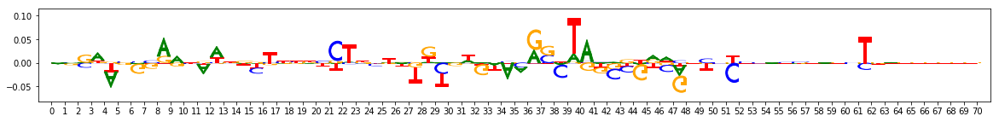

onehot, fwd and rev:


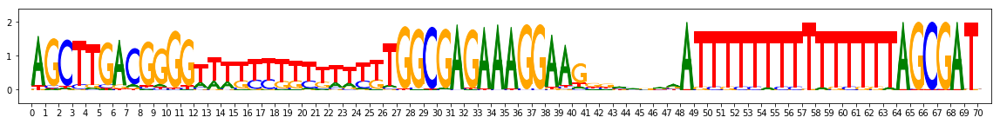

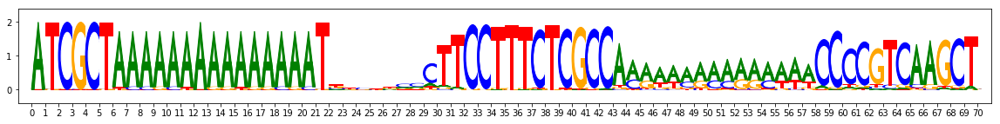

metacluster_0 pattern_2
Task 0 hypothetical scores:


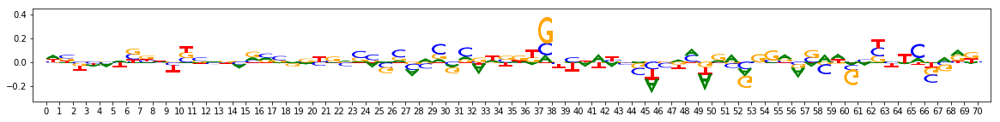

Task 0 actual importance scores:


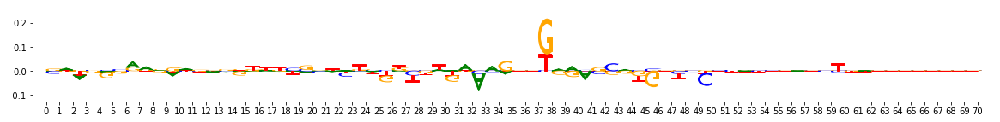

onehot, fwd and rev:


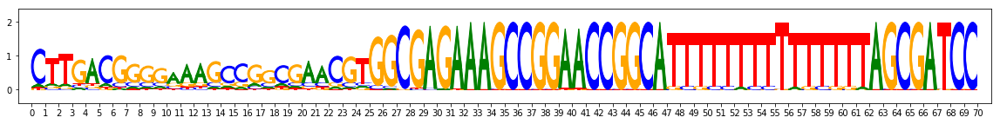

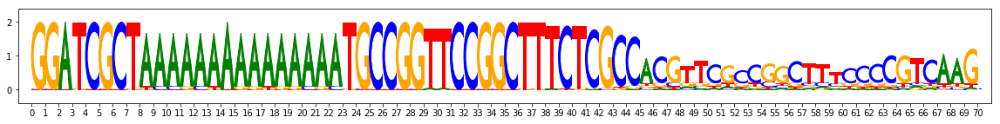

metacluster_0 pattern_3
Task 0 hypothetical scores:


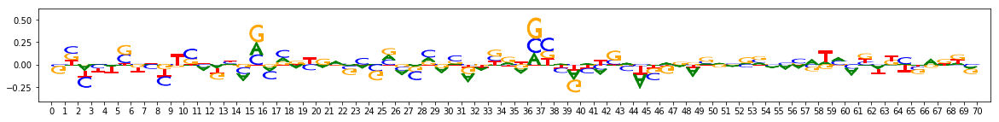

Task 0 actual importance scores:


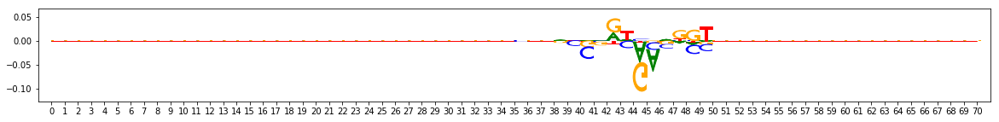

onehot, fwd and rev:


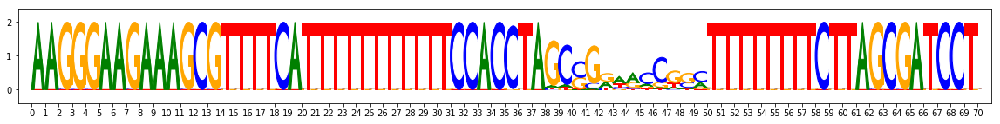

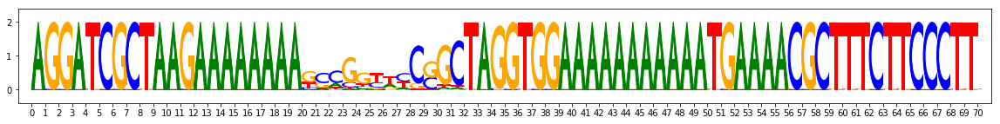

metacluster_0 pattern_4
Task 0 hypothetical scores:


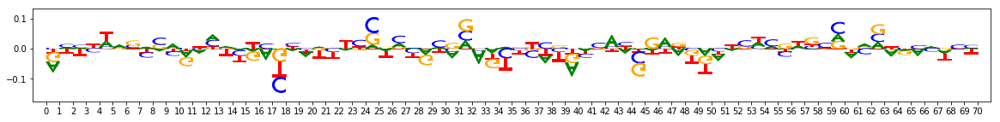

Task 0 actual importance scores:


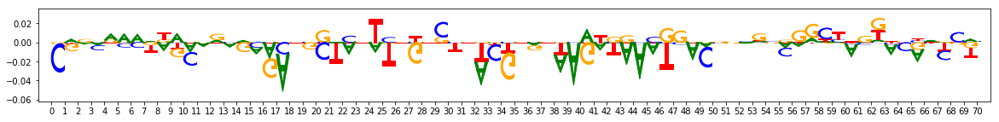

onehot, fwd and rev:


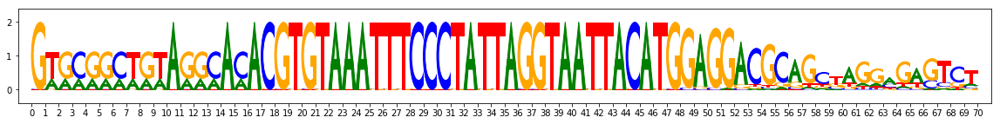

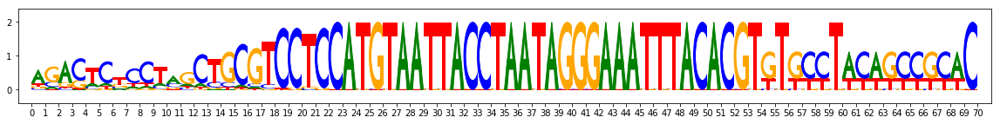

metacluster_0 pattern_5
Task 0 hypothetical scores:


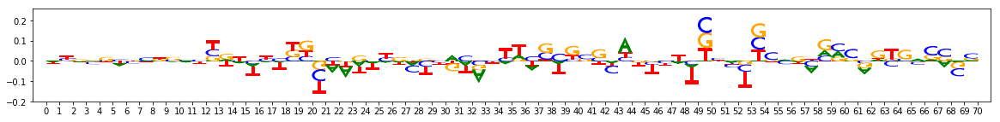

Task 0 actual importance scores:


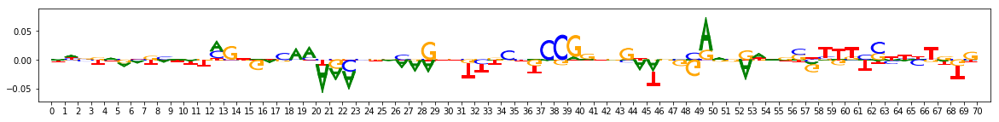

onehot, fwd and rev:


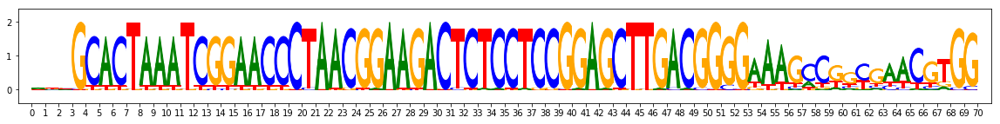

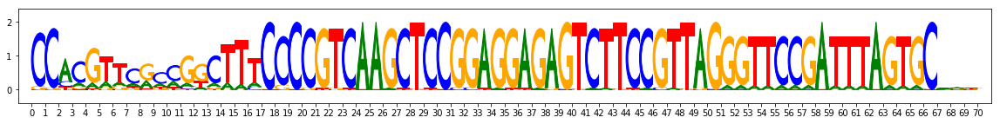

metacluster_0 pattern_6
Task 0 hypothetical scores:


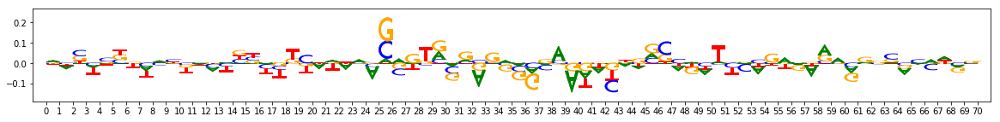

Task 0 actual importance scores:


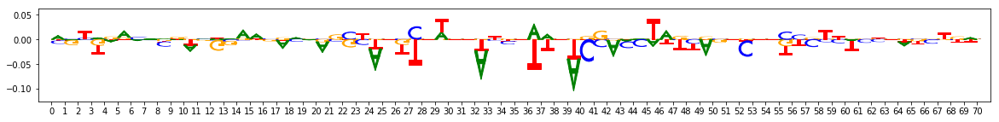

onehot, fwd and rev:


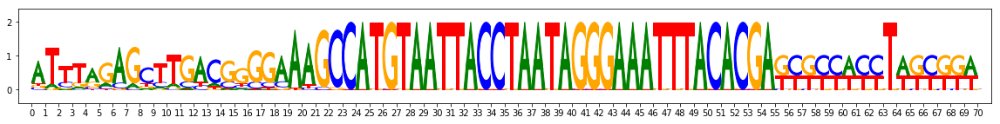

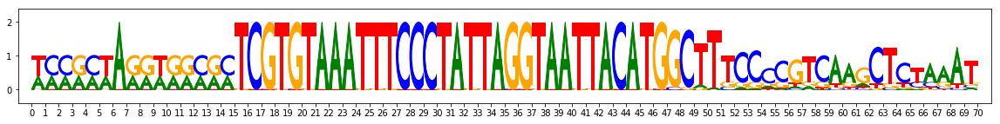

metacluster_0 pattern_7
Task 0 hypothetical scores:


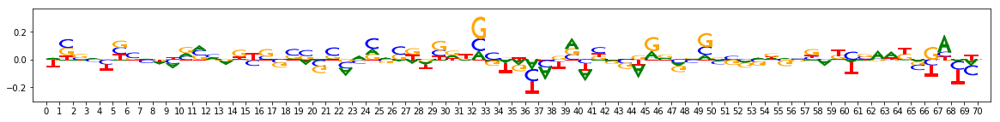

Task 0 actual importance scores:


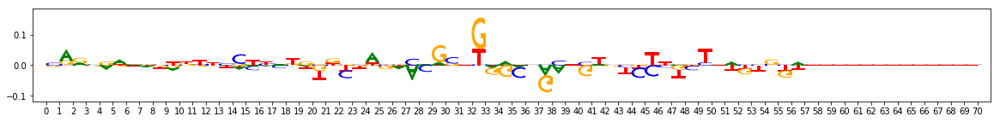

onehot, fwd and rev:


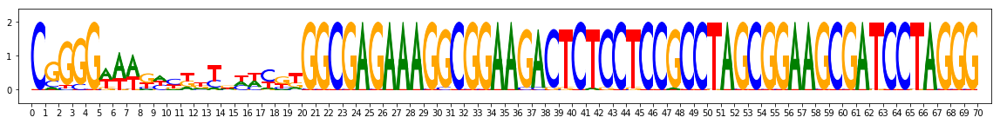

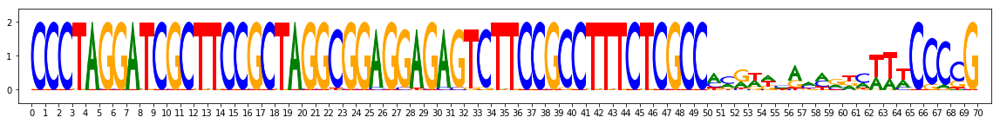

metacluster_0 pattern_8
Task 0 hypothetical scores:


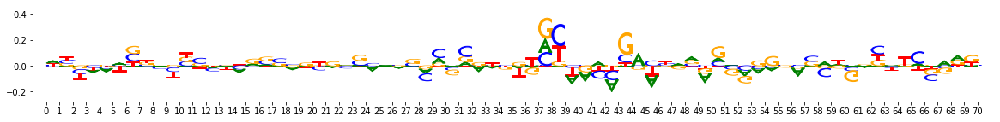

Task 0 actual importance scores:


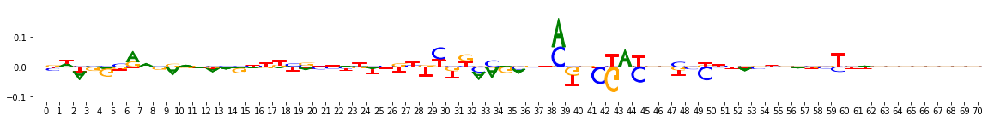

onehot, fwd and rev:


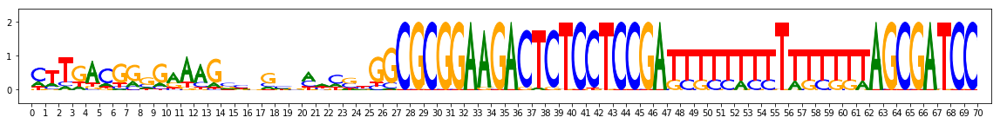

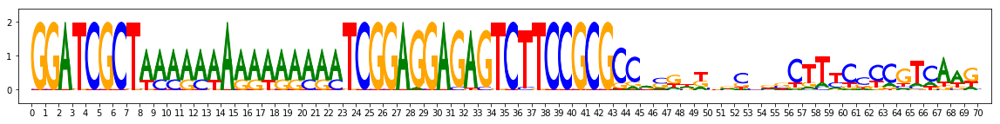

metacluster_1
activity pattern: [1]
metacluster_1 pattern_0
Task 0 hypothetical scores:


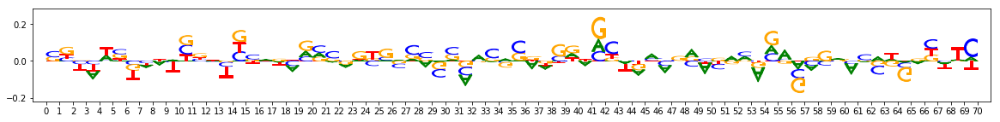

Task 0 actual importance scores:


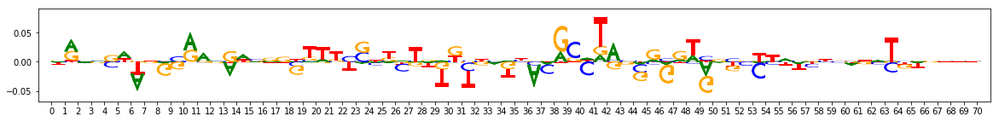

onehot, fwd and rev:


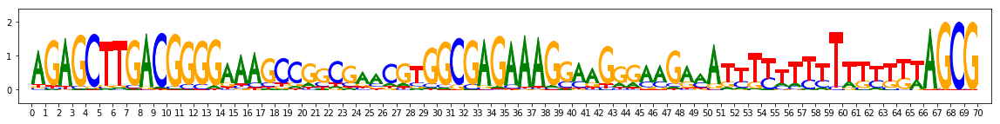

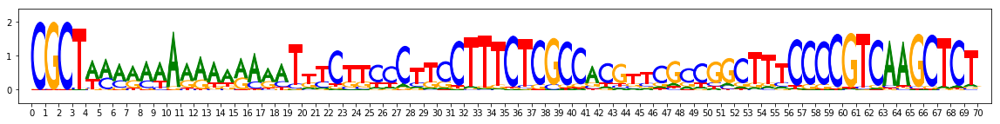

metacluster_1 pattern_1
Task 0 hypothetical scores:


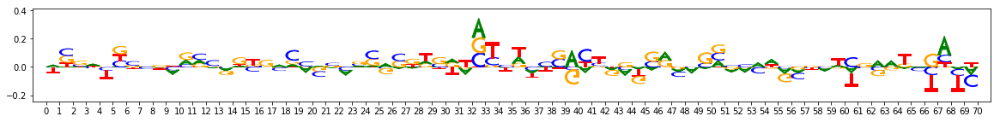

Task 0 actual importance scores:


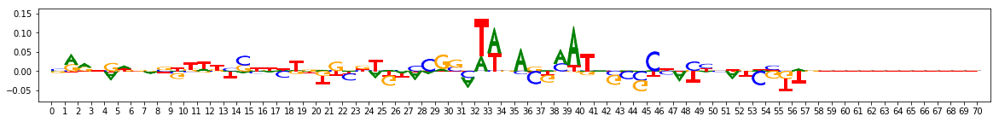

onehot, fwd and rev:


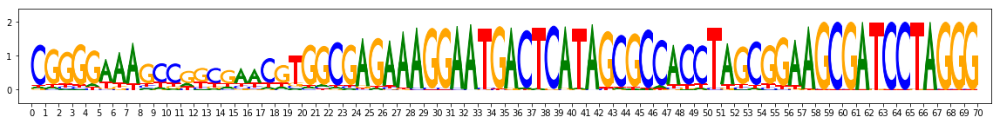

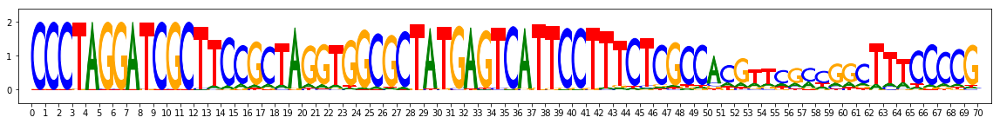

metacluster_1 pattern_2
Task 0 hypothetical scores:


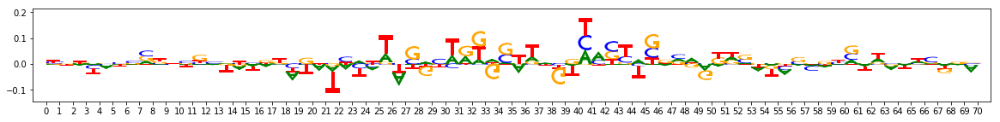

Task 0 actual importance scores:


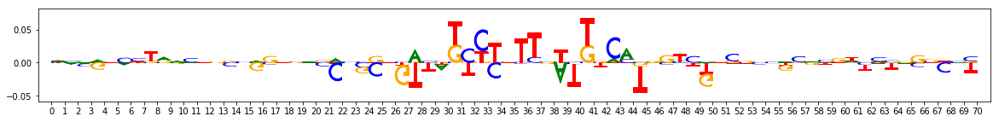

onehot, fwd and rev:


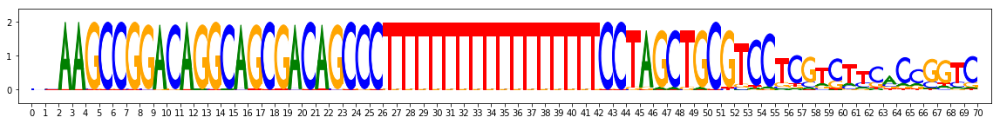

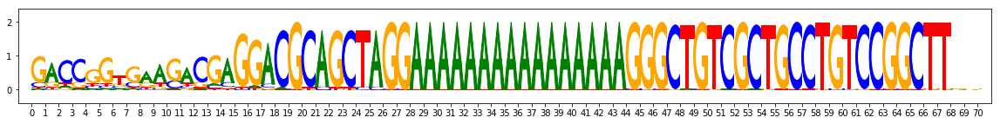

metacluster_1 pattern_3
Task 0 hypothetical scores:


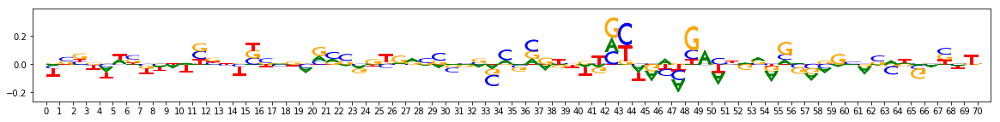

Task 0 actual importance scores:


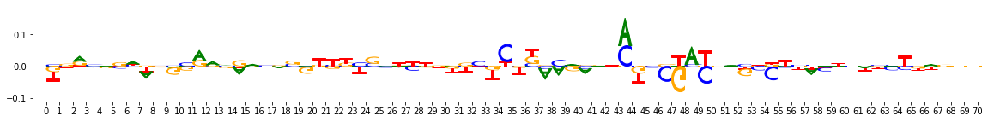

onehot, fwd and rev:


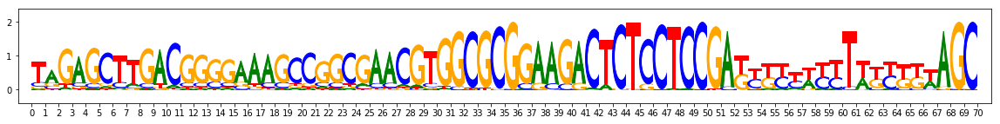

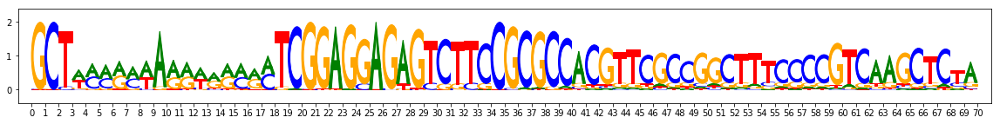

metacluster_1 pattern_4
Task 0 hypothetical scores:


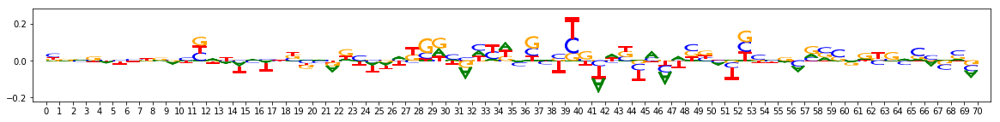

Task 0 actual importance scores:


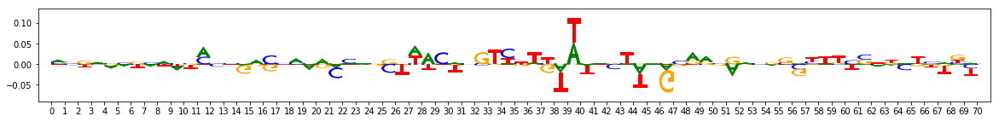

onehot, fwd and rev:


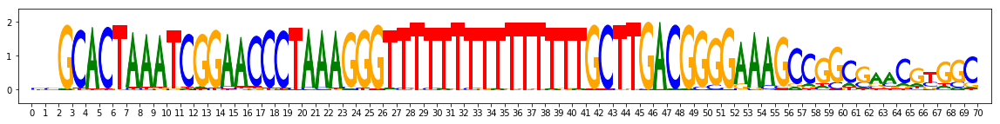

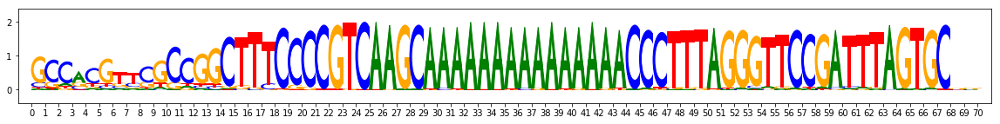

metacluster_1 pattern_5
Task 0 hypothetical scores:


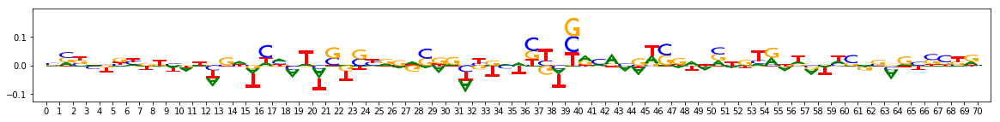

Task 0 actual importance scores:


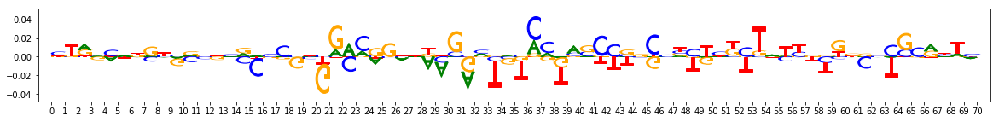

onehot, fwd and rev:


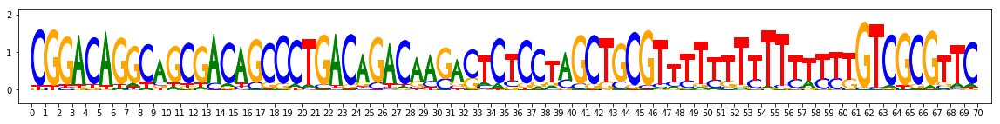

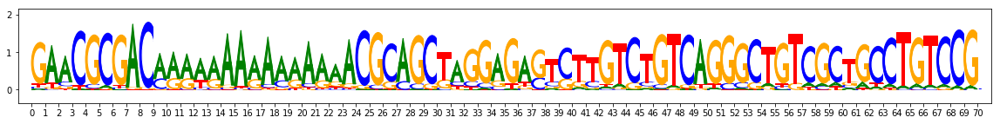

metacluster_1 pattern_6
Task 0 hypothetical scores:


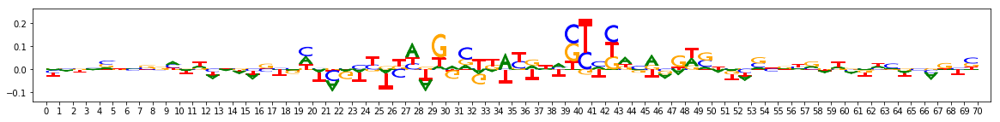

Task 0 actual importance scores:


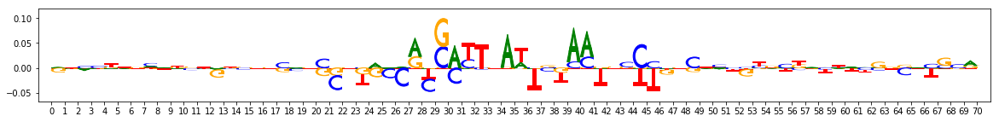

onehot, fwd and rev:


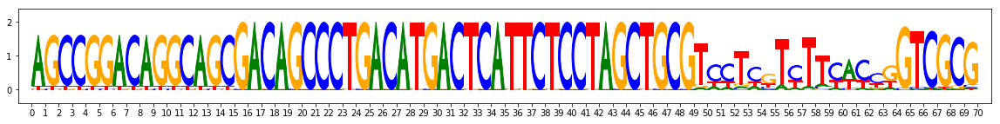

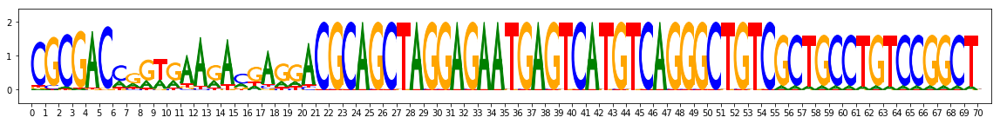

metacluster_1 pattern_7
Task 0 hypothetical scores:


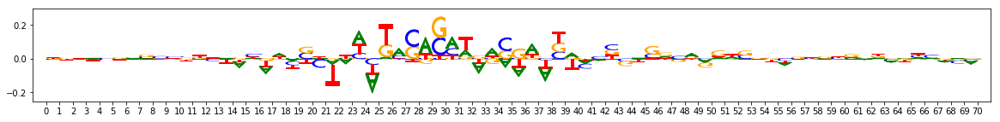

Task 0 actual importance scores:


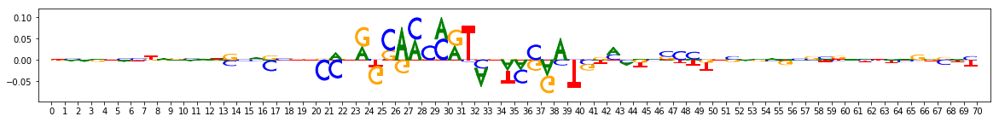

onehot, fwd and rev:


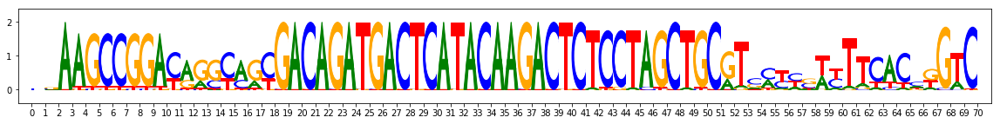

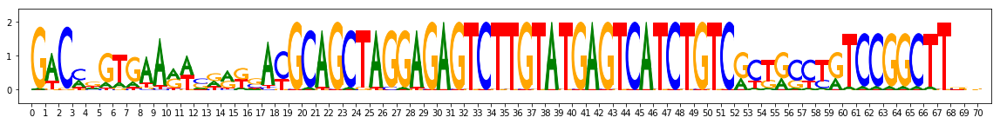

metacluster_1 pattern_8
Task 0 hypothetical scores:


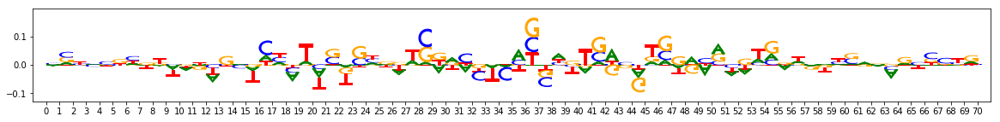

Task 0 actual importance scores:


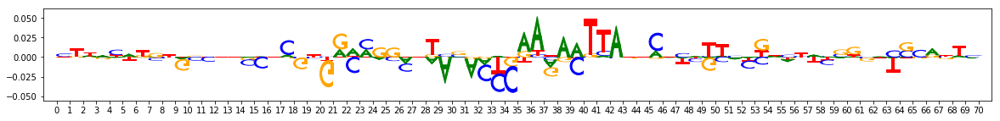

onehot, fwd and rev:


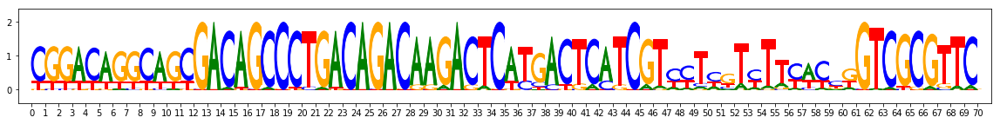

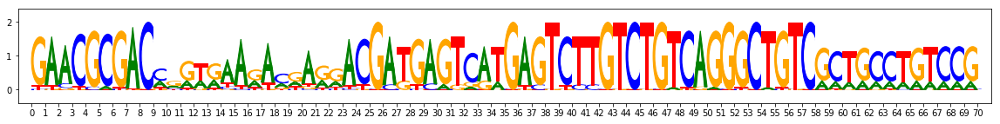

metacluster_1 pattern_9
Task 0 hypothetical scores:


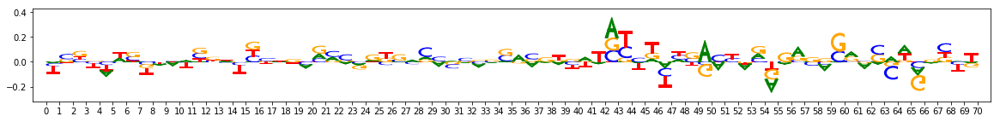

Task 0 actual importance scores:


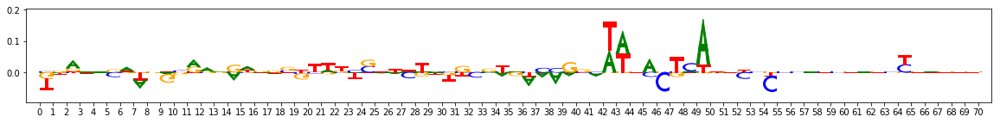

onehot, fwd and rev:


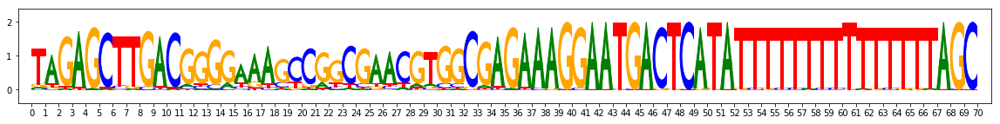

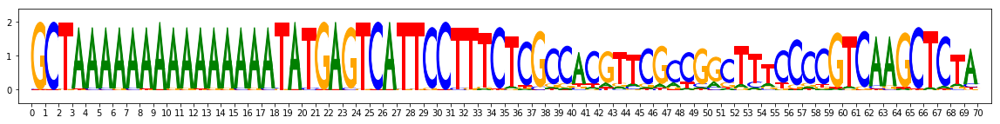

metacluster_1 pattern_10
Task 0 hypothetical scores:


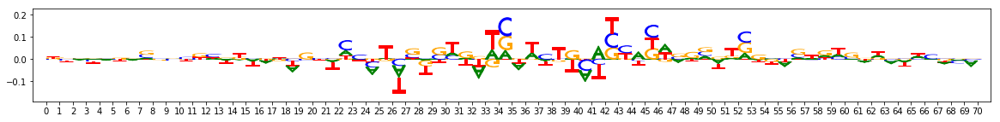

Task 0 actual importance scores:


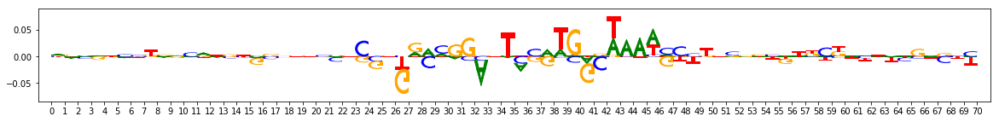

onehot, fwd and rev:


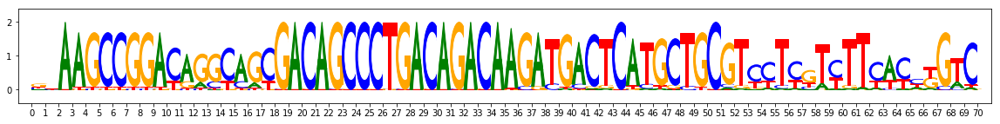

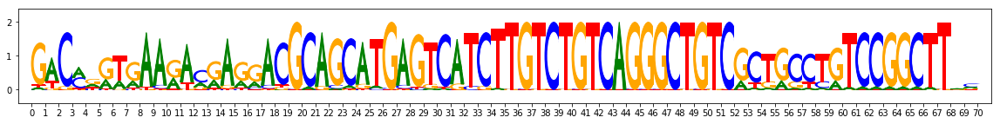

metacluster_1 pattern_11
Task 0 hypothetical scores:


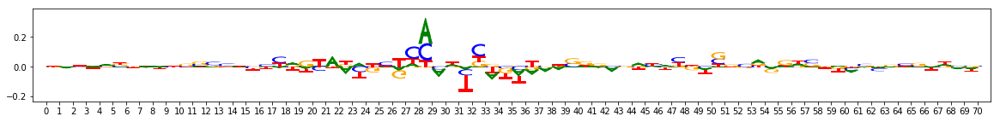

Task 0 actual importance scores:


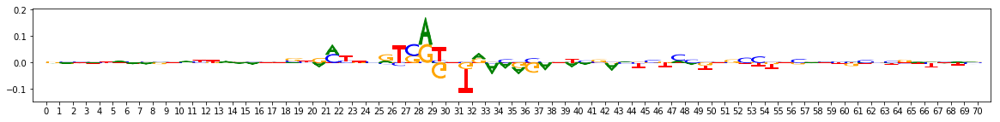

onehot, fwd and rev:


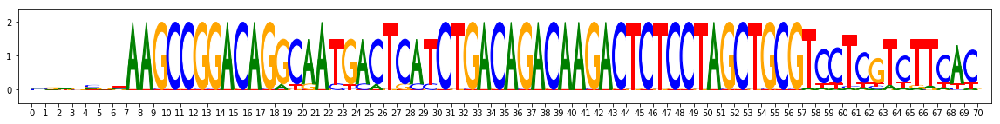

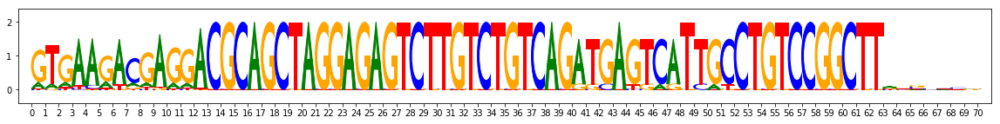

metacluster_1 pattern_12
Task 0 hypothetical scores:


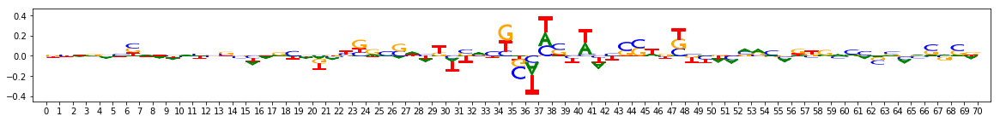

Task 0 actual importance scores:


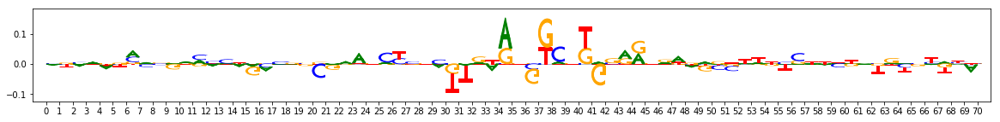

onehot, fwd and rev:


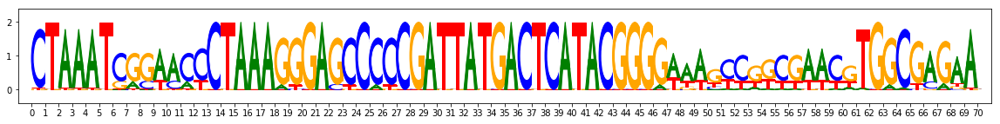

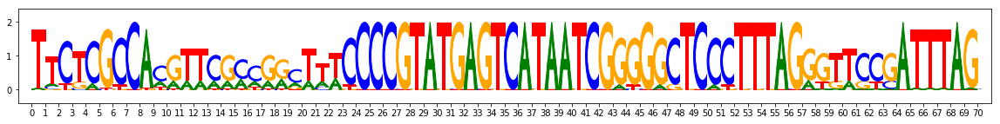

metacluster_1 pattern_13
Task 0 hypothetical scores:


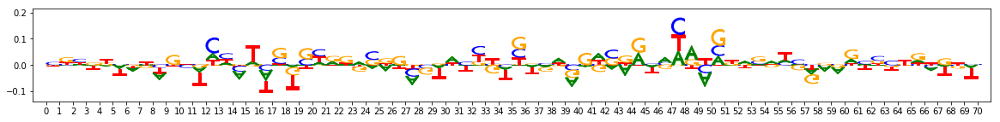

Task 0 actual importance scores:


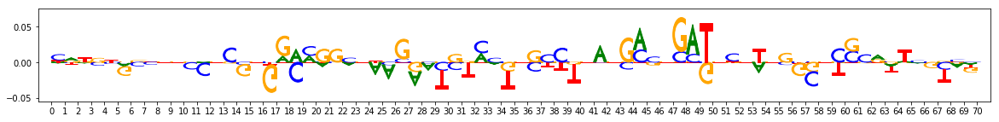

onehot, fwd and rev:


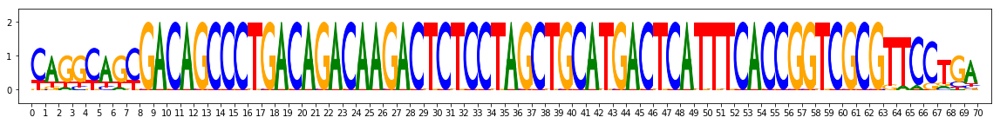

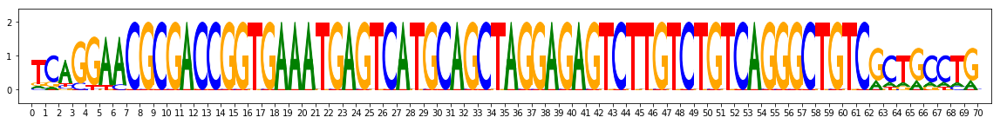

metacluster_1 pattern_14
Task 0 hypothetical scores:


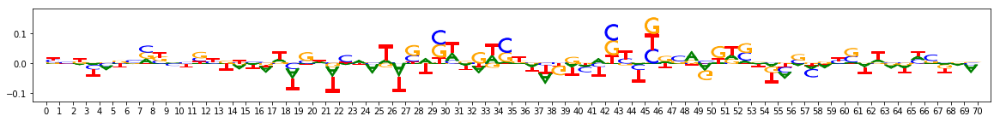

Task 0 actual importance scores:


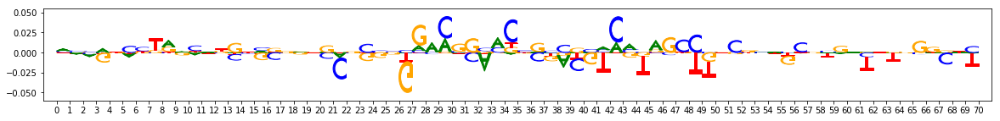

onehot, fwd and rev:


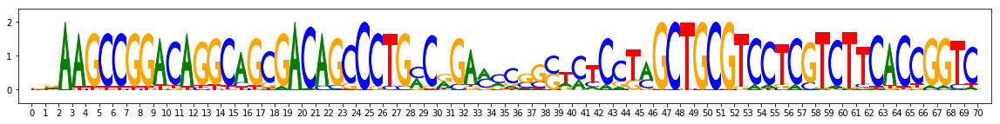

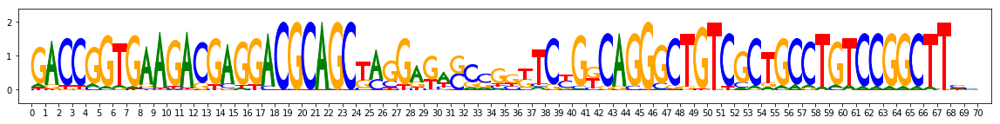

metacluster_1 pattern_15
Task 0 hypothetical scores:


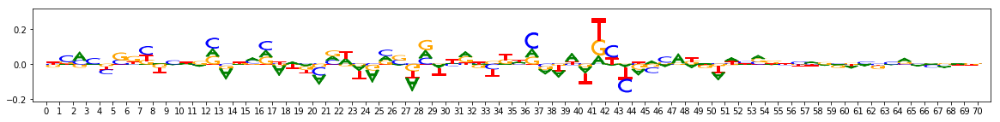

Task 0 actual importance scores:


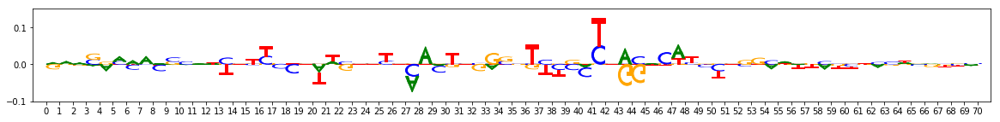

onehot, fwd and rev:


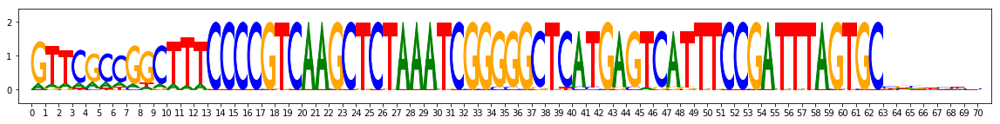

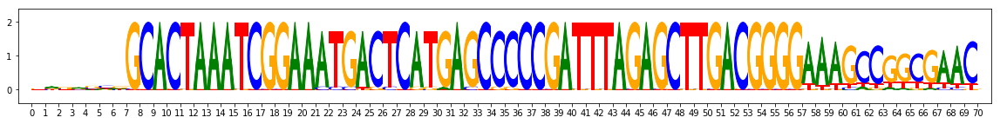

metacluster_1 pattern_16
Task 0 hypothetical scores:


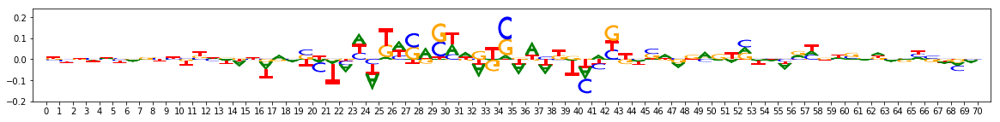

Task 0 actual importance scores:


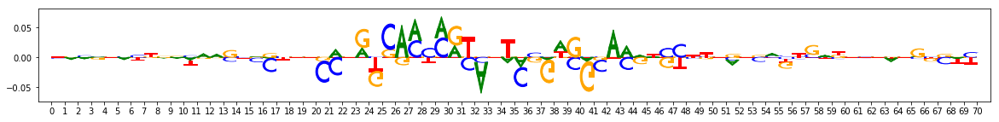

onehot, fwd and rev:


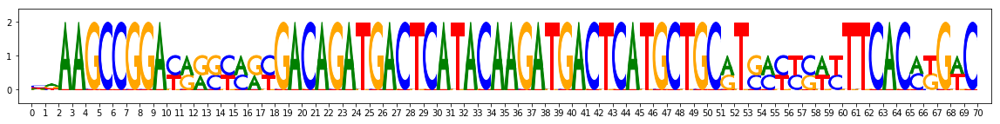

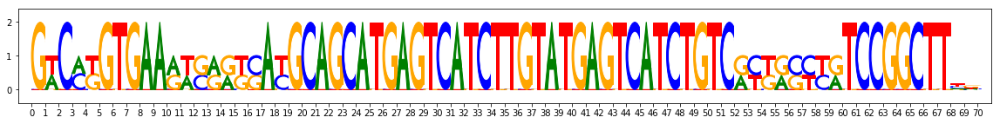

metacluster_1 pattern_17
Task 0 hypothetical scores:


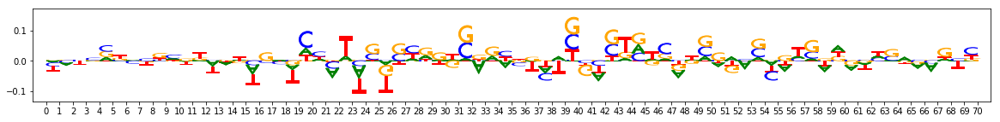

Task 0 actual importance scores:


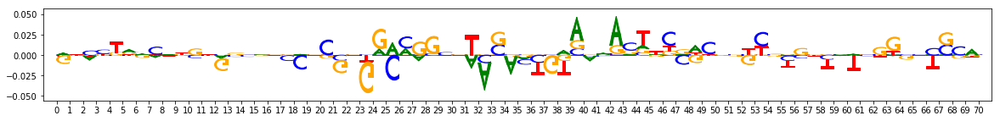

onehot, fwd and rev:


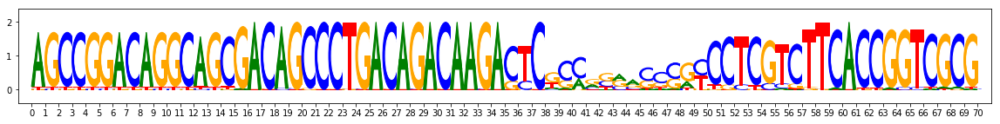

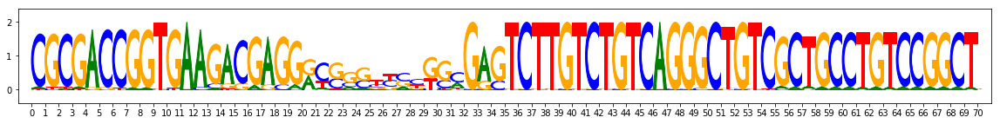

In [9]:
from collections import Counter
from modisco.visualization import viz_sequence
from matplotlib import pyplot as plt

import modisco.affinitymat.core
import modisco.cluster.phenograph.core
import modisco.cluster.phenograph.cluster
import modisco.cluster.core
import modisco.aggregator
import h5py

!rm 'tfmodiscoresults.hdf5'
grp = h5py.File('tfmodiscoresults.hdf5')
tfmodisco.save_hdf5(grp)
hdf5_results = h5py.File('tfmodiscoresults.hdf5', 'r')

print("Metaclusters heatmap")
import seaborn as sns
activity_patterns = np.array(hdf5_results['metaclustering_results']['attribute_vectors'])[
                    np.array(
        [x[0] for x in sorted(
                enumerate(hdf5_results['metaclustering_results']['metacluster_indices']),
               key=lambda x: x[1])])]
sns.heatmap(activity_patterns, center=0)
plt.show()

metacluster_names = [
    x.decode("utf-8") for x in 
    list(hdf5_results["metaclustering_results"]
         ["all_metacluster_names"][:])]

ids = set()

all_patterns = []
for metacluster_name in metacluster_names:
    print(metacluster_name)
    metacluster_grp = (hdf5_results["metacluster_idx_to_submetacluster_results"]
                                   [metacluster_name])
    print("activity pattern:",metacluster_grp["activity_pattern"][:])
    all_pattern_names = [x.decode("utf-8") for x in 
                         list(metacluster_grp["seqlets_to_patterns_result"]
                                             ["patterns"]["all_pattern_names"][:])]
    if (len(all_pattern_names)==0):
        print("No motifs found for this activity pattern")
    for pattern_name in all_pattern_names:
        print(metacluster_name, pattern_name)
        all_patterns.append((metacluster_name, pattern_name))
        pattern = metacluster_grp["seqlets_to_patterns_result"]["patterns"][pattern_name]
        #print(pattern["seqlets_and_alnmts"]["seqlets"].value)
        
        for s in pattern['seqlets_and_alnmts']['seqlets'].value:
            ids.add(int(s.decode().split(',')[0].split(':')[1]))
        background = np.array([0.27, 0.23, 0.23, 0.27])
        print("Task 0 hypothetical scores:")
        viz_sequence.plot_weights(pattern["task0_hypothetical_contribs"]["fwd"])
        print("Task 0 actual importance scores:")
        viz_sequence.plot_weights(pattern["task0_contrib_scores"]["fwd"])
        print("onehot, fwd and rev:")
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["fwd"]),
                                                        background=background)) 
        viz_sequence.plot_weights(viz_sequence.ic_scale(np.array(pattern["sequence"]["rev"]),
                                                        background=background)) 


### Small Check

Prints out how many sequences do not have any associated motifs from TFModisco.

We printed out first 50 sequences, check how many of them were labelled with TFModisco

In [10]:
len([i for i in range(len(t.motifs.motifs)) if i not in ids])

3184

In [11]:
for i in range(50):
    if i in ids:
        print(i)

40
